#### Ski Resort Project University of Zürich 2020
## The test notebook for case5_Champex 1486-2194 m
## setup 1: 9000 experiments 200 scenarios & 45 Policies

This notebook is used for the visualization of the "ema_workbench Ski_Resort" project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [1]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\em_framework\optimization.py:48: ImportWarning: platypus based optimization not available
  warnings.warn("platypus based optimization not available", ImportWarning)


### *Seting up the display extent*

In [2]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLRM Framework

## Step 5: Model deployment

### Loading the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [3]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\setup1'
root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\setup1'

rootOut = os.path.join(root, 'Results_3')
fh = os.path.join(rootOut, '9000_runs.tar.gz')
experiments, outcomes = load_results(fh)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\prim.py:31: ImportWarning: altair based interactive inspection not available
  "inspection not available"), ImportWarning)
[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\setup1\Results_3\9000_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [4]:
print(experiments.shape)
print(list(experiments.keys()))
print(list(outcomes.keys()))

(9000, 12)
['X2fM', 'X3iPot', 'X5temp', 'X6tempArt', 'Xfactor1', 'xClimateModel', 'xRCP', 'x1SnowThershold', 'xGoodDays', 'scenario', 'policy', 'model']
['S_Ave_GoodDay', 'GCM_RCM', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


#### S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm) 
#### GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)
#### Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)
#### S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)
#### S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort
#### S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points
#### tipping_points: Number of tipping points (1981-2100)

## Step 6: Visualization of the EMA_Workbench Results

 the analysis package of ema_workbench contains a wide range of techniques for visualization and analysis of the results from series of computational experiments. 

### Visualization with ema-workbench - part1

### Pairwise Scatter Plot

[MainProcess/DEBUG] generating pairwise scatter plot


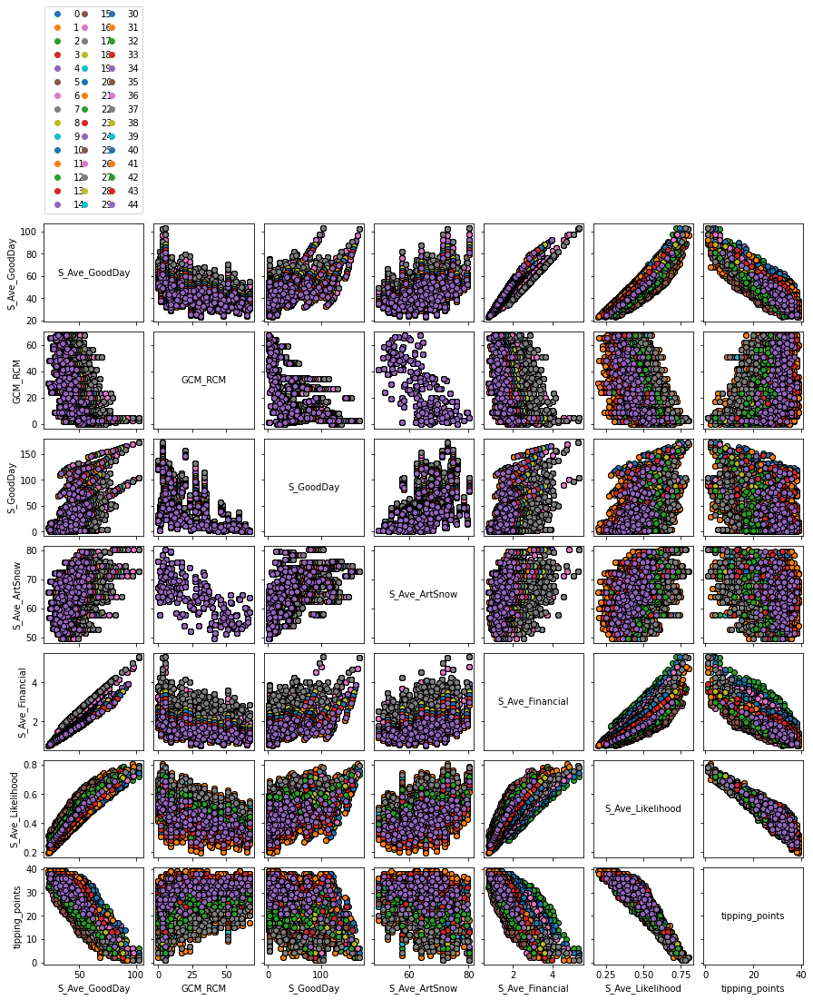

In [5]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)

fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
#fig.savefig(os.path.join(rootOut, 'SA_All_outputs.tiff'), format='tiff', dpi=600)


plt.show()

In [10]:
outcomes2 = outcomes
outcomes2 = outcomes2.pop('GCM_RCM')

KeyError: 'GCM_RCM'

In [11]:
print(outcomes2)

{'S_Ave_GoodDay': array([47.99344522, 56.22107869, 58.24189407, ..., 49.23266774,
       37.76572092, 38.33484658]), 'S_GoodDay': array([[ 77.39185714,  48.02342857,  59.43710714, ...,  43.63239286,
         14.52428571,  34.04671429],
       [ 46.79014286,  29.78067857, 147.86446429, ...,  86.00496429,
         60.46267857,  70.52628571],
       [ 22.64160714,  32.39342857,  40.50614286, ...,  33.22014286,
         63.51117857,  33.63003571],
       ...,
       [ 40.13434483,  92.77448276,  48.22313793, ...,  58.23044828,
         86.28265517, 115.81324138],
       [ 82.20193103,  32.18558621,  57.25606897, ...,   9.77903448,
         32.64237931,  47.88372414],
       [ 49.38775862,  48.55834483,  87.47572414, ...,  16.08927586,
         41.85686207,  14.28251724]]), 'S_Ave_ArtSnow': array([76.68576271, 62.4690678 , 79.17016949, ..., 67.41194915,
       69.44338983, 75.85728814]), 'S_Ave_Financial': array([1.79584746, 2.12686441, 2.19771186, ..., 1.76381356, 1.33169492,
       1.3605

In [12]:
new_dict = {key:val for key, val in outcomes2.items() if key != 'GCM_RCM'} 

In [13]:
print(list(new_dict.keys()))

['S_Ave_GoodDay', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


[MainProcess/DEBUG] generating pairwise scatter plot
No handles with labels found to put in legend.


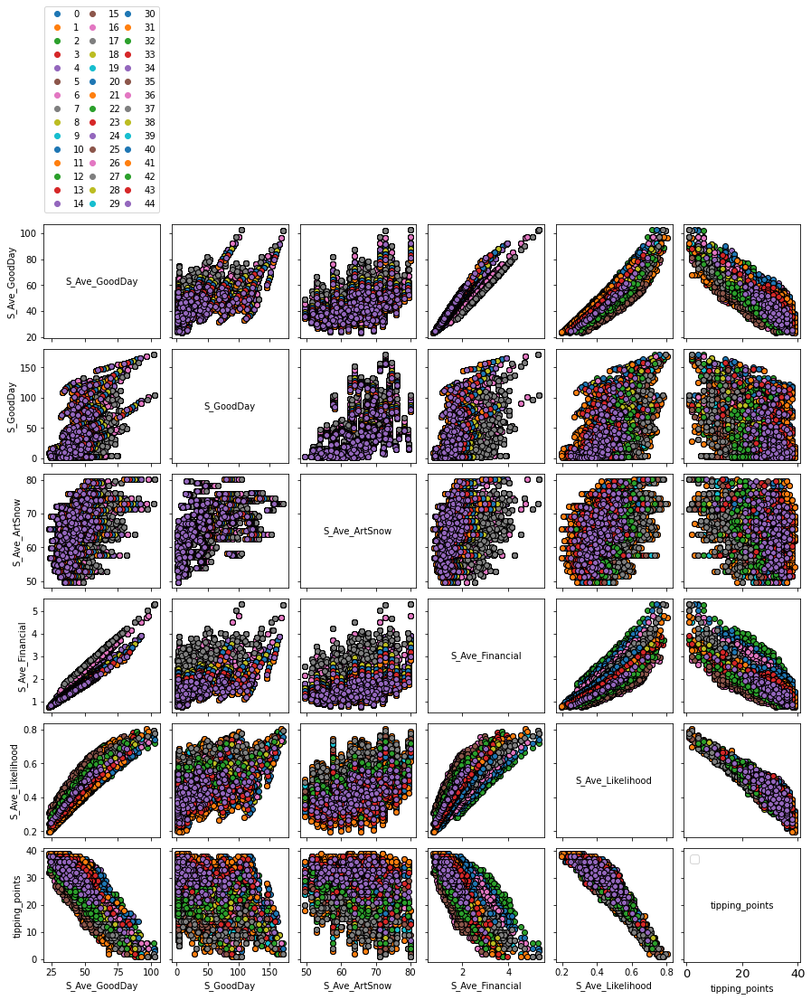

In [14]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, new_dict, group_by='policy',
                                         legend=True)

plt.yticks(fontsize=13)
plt.xticks(fontsize=13)
plt.legend(fontsize=13)

fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.svg'), format='svg', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.tiff'), format='tiff', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.tiff'), format='tiff', dpi=150)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.jpg'), format='jpg', dpi=150)



plt.show()

### Moving the outputs to the folder of results
### Assign the address of outputs folders

In [15]:
import tarfile

shutil.move(os.path.join(root, 'Outputs_py'), os.path.join(rootOut, 'Outputs_py'))
shutil.move(os.path.join(root, 'outSeason'), os.path.join(rootOut, 'outSeason')) 
shutil.move(os.path.join(root, 'outSeason_Likelihood_survival'), os.path.join(rootOut, 'outSeason_Likelihood_survival')) 
shutil.move(os.path.join(root, 'outSeasonArt'), os.path.join(rootOut, 'outSeasonArt')) 
shutil.move(os.path.join(root, 'outSeasonFinancial'), os.path.join(rootOut, 'outSeasonFinancial')) 

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '9000_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '9000_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '9000_runs')

In [16]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'S_Ave_GoodDay.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'GCM_RCM.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'S_GoodDay.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'S_Ave_ArtSnow.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Financial.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Likelihood.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]
df4_ema_y7 = pd.read_csv(os.path.join(out_ema, 'tipping_points.csv'), header=None)
df4_ema_y7.columns = ["Yout7"]

#### Make a database from the outputs of ema framework by concatinating the every output and experiments table

In [17]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6, df4_ema_y7 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.580014,1051.788559,5.127577,-1.146400,2.835871,0.516809,1.0,280.0,100.0,0,0,UZHModel,47.993445,6,77.391857,48.023429,59.437107,57.823179,70.404357,131.126893,35.404821,43.851179,68.867893,8.400107,42.198214,95.818893,112.911250,79.838929,84.844393,70.191393,50.736857,73.943286,59.714321,66.783821,...,77.811536,36.934107,43.044286,29.569286,68.191179,61.666071,105.603357,39.014714,58.526464,35.605393,5.129250,25.485286,24.224536,37.448607,29.275179,85.545893,15.420214,6.384071,22.945643,48.821393,105.784321,39.088643,10.968929,83.434857,43.755571,16.722607,74.807429,43.632393,14.524286,34.046714,76.685763,1.795847,0.399586,34.0
1,1.207303,997.452394,5.797032,-1.987439,1.943691,0.397520,1.0,280.0,100.0,1,0,UZHModel,56.221079,4,46.790143,29.780679,147.864464,68.187857,61.555393,52.139679,28.287107,56.865357,87.690500,76.095179,80.042857,27.737643,37.249964,67.556429,63.251214,38.627750,39.938500,111.806036,42.502893,40.399071,...,22.933250,31.382786,26.245964,72.123857,44.495429,107.489750,81.989714,29.677000,17.204750,44.223393,2.727143,80.707643,26.153000,16.583143,20.344429,57.544250,113.396893,37.103964,33.044857,23.032286,68.543250,32.620607,84.798036,69.220607,80.544393,62.300536,4.385786,86.004964,60.462679,70.526286,62.469068,2.126864,0.465437,32.0
2,1.292598,973.208451,5.997128,-1.037563,1.574825,0.836672,1.0,280.0,100.0,2,0,UZHModel,58.241894,9,22.641607,32.393429,40.506143,87.109571,63.342714,99.909929,65.528321,57.173786,39.044714,91.853786,86.046071,105.235964,110.801429,77.881107,91.662893,80.820107,73.965821,41.609321,17.125143,40.852607,...,77.129000,52.264107,9.782071,40.177179,100.150071,48.526321,76.205214,118.633500,36.565750,93.117179,97.543893,24.862286,97.759429,54.911571,51.753571,76.606393,52.668500,84.333679,44.327036,48.081643,65.946607,36.827536,37.564143,35.211036,88.786750,32.531893,52.998357,33.220143,63.511179,33.630036,79.170169,2.197712,0.488322,34.0
3,1.239612,1009.941829,5.532630,-1.166626,2.548417,0.004587,3.0,280.0,100.0,3,0,UZHModel,41.177765,37,68.090071,130.849286,83.825964,42.144321,44.509607,84.278500,133.822000,60.103000,67.309607,63.860464,71.595536,68.985071,98.289929,66.213929,55.942429,91.949893,68.374607,83.540929,54.885429,68.759500,...,11.162250,10.053357,7.472250,19.373786,14.828071,10.288286,30.327714,58.340607,41.558286,5.416000,10.341071,25.977286,7.237214,10.034857,10.526643,34.327429,11.476000,3.952071,12.669464,5.675393,6.638679,22.499714,9.716536,6.251536,0.849536,16.021643,12.090179,4.636143,0.656143,3.457929,61.396102,1.535932,0.342496,34.0
4,1.146874,1048.777834,5.261046,-1.473425,1.550145,0.137789,1.0,280.0,100.0,4,0,UZHModel,49.902018,2,30.070393,121.801714,100.325357,35.999286,44.621071,92.242286,78.109286,81.233929,78.427071,64.866750,43.955286,41.756714,69.921250,55.025786,25.452786,66.694964,64.700107,57.656393,33.069393,59.879321,...,44.556607,38.360857,19.248036,19.857357,17.452643,119.955321,138.251857,63.810179,34.429036,11.963571,35.492036,65.077143,37.485643,47.058321,31.599429,35.702179,37.483321,30.615321,8.443357,35.655893,38.538000,24.570250,45.794321,17.244214,17.104929,51.310500,41.341643,18.410750,12.320893,44.015786,68.677203,1.885254,0.411964,33.0


In [18]:
df_final_ema.to_csv(os.path.join(rootVisualization, 'df_final_ema.csv'), index = False)

In [19]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [20]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [21]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [22]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

9000
9000
9000
9000


In [23]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [24]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [25]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)


#### Check the header of outputs

In [26]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_sc_26_5
Money_sc_26_5
ArtSnowPossibility_sc_26_5
isOverSnow_sc_26_5


In [27]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP26' in emptyMatrixArt[i][0,1] or \
                             '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP45' in emptyMatrixArt[i][0,1] or \
                            '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP85' in emptyMatrixArt[i][0,1] or \
                            '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [28]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
9000
2142000
<U47
str1504
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000


In [29]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [30]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [31]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[26.65375564]
[36.86637444]
[54.1980537]
[73.23182197]
[88.87440455]
(118, 1)
[0.95]
[1.46]
[2.215]
[3.06]
[4.001]
(118, 1)
[58.955]
[63.8525]
[70.8]
[79.7525]
[85.32]
(118, 1)
[32.43848148]
[46.20458889]
[68.05865741]
[93.92518085]
[100.]
(118, 1)


#### Set the parameters of making figure

In [32]:
num_Simulation = 9000
p_Step = 20
alpha_Fade = 0.04

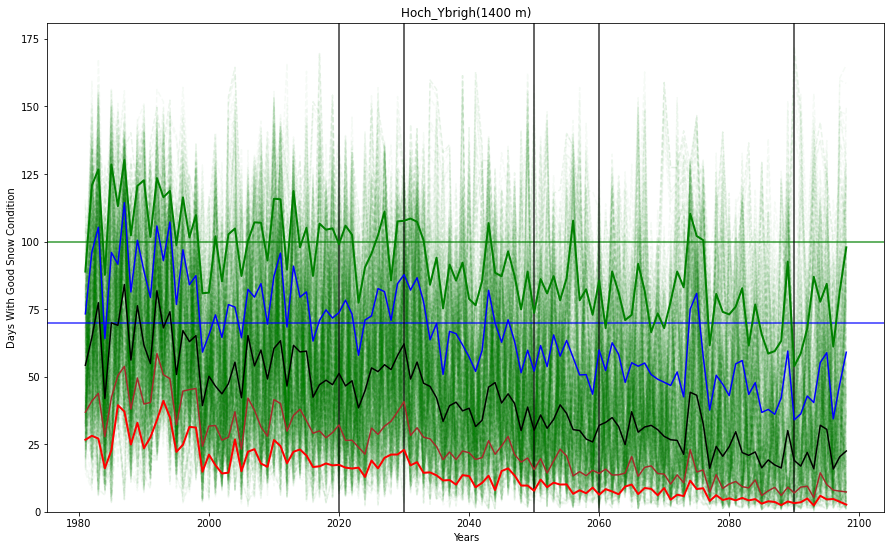

In [33]:
fig1, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(1400 m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig1.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

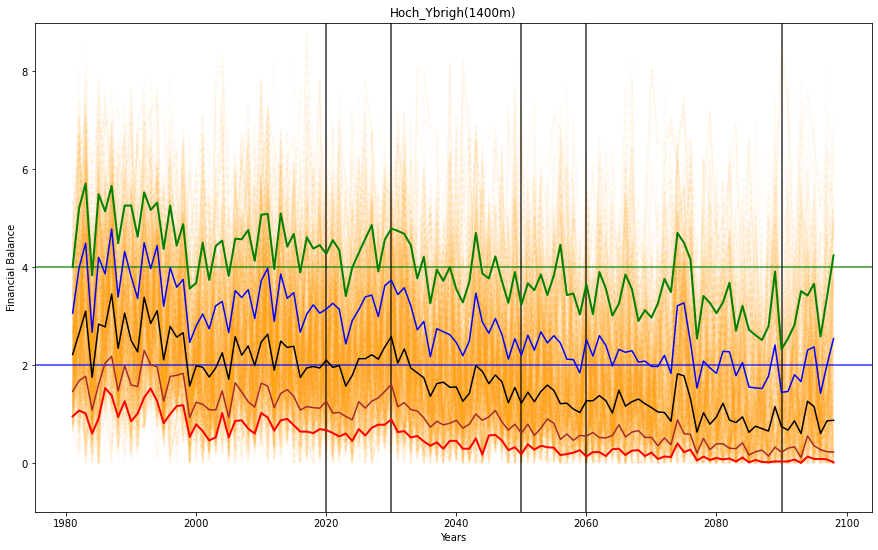

In [34]:
fig2, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Balance')

fig2.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

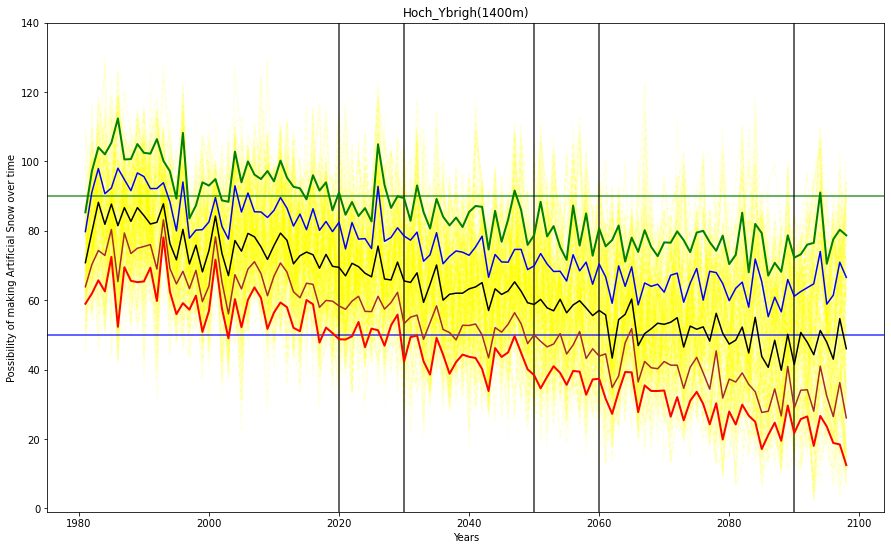

In [35]:
fig3, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Art[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='yellow', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Art, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Art, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Art, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Art, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Art, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =140)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Possibility of making Artificial Snow over time')

fig3.savefig(os.path.join(rootVisualization, 'RCP_All_ArtSnow.svg'), format='svg', dpi=300)

plt.show()

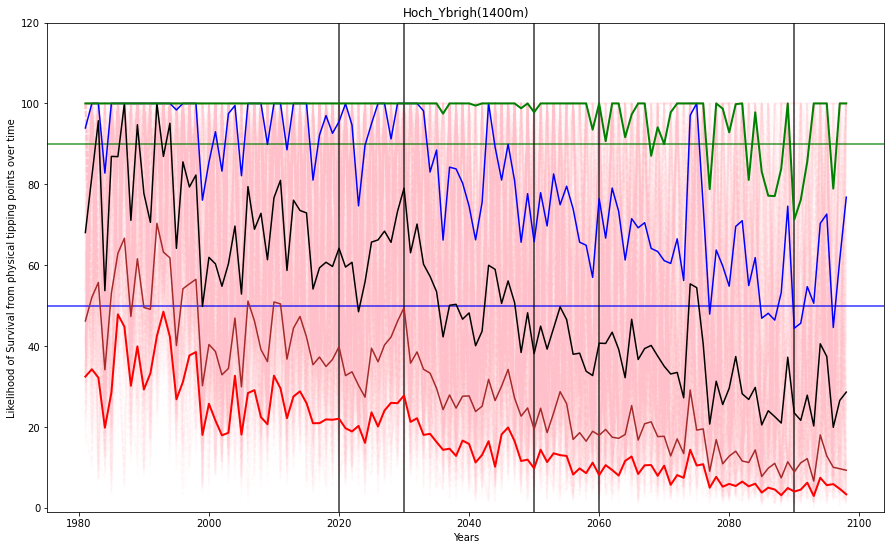

In [36]:
fig4, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood of Survival from physical tipping points over time')

fig4.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

## Scenario Discovery 
### A model driven approach to scenario development

There is ample literature on both CART and PRIM and their relative merits for use in scenario discovery.

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

In [37]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['S_Ave_GoodDay'] < 50
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 5600 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.9772727272727273, mass: 0.07333333333333333, coverage: 0.11517857142857142, density: 0.9772727272727273 restricted_dimensions: 3


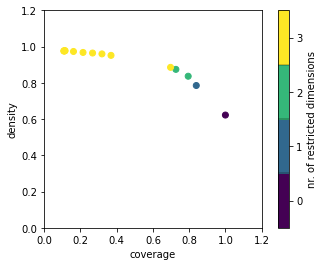

<Figure size 432x288 with 0 Axes>

In [38]:
#import mpld3
#fig, axs = plt.subplots()
#fig5, axs = plt.subplots(figsize=(15,9))
box1.show_tradeoff()
plt.show()
plt.savefig(os.path.join(rootVisualization, 'coverage_density_1.png'))
            
#mpld3.display()
#fig5.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

coverage     0.108036
density      0.975806
id                 10
mass        0.0688889
mean         0.975806
res_dim             3
Name: 10, dtype: object

                         box 10                  \
                            min             max   
X5temp                  4.50656          5.9264   
xRCP                        2.5               3   
x1SnowThershold  {290.0, 300.0}  {290.0, 300.0}   

                                                 
                                      qp values  
X5temp                [-1.0, 0.661389163192857]  
xRCP             [1.4992414106706947e-38, -1.0]  
x1SnowThershold   [1.725487086639725e-17, -1.0]  



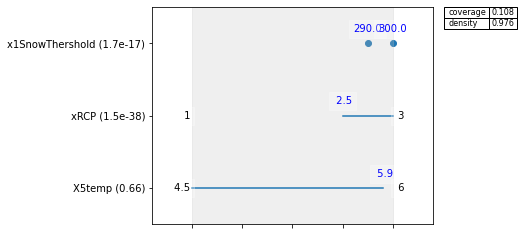

In [39]:
# Saeed : explore the inspect effect
box1.inspect(10)
box1.inspect(10, style='graph')
plt.show()

x1SnowThershold [290.0, 300.0, 260.0, 200.0, 270.0, 240.0, 280.0, 250.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


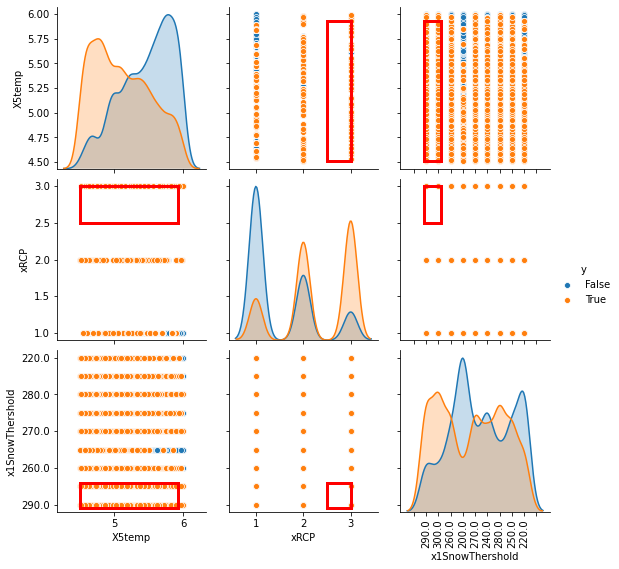

In [40]:
# fig, axs = plt.subplots()
axs1 = box1.show_pairs_scatter(10)
plt.show()
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.svg'), format='svg', dpi=600)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.tiff'), format='tiff', dpi=300)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_70.tiff'), format='tiff', dpi=150)

In [41]:
box2 = prim_alg.find_box()

[MainProcess/INFO] 8340 points remaining, containing 4955 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.9621212121212122, mass: 0.07333333333333333, coverage: 0.11339285714285714, density: 0.9621212121212122 restricted_dimensions: 3


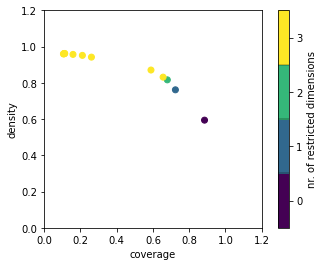

In [42]:
#import mpld3
box2.show_tradeoff()
plt.show()
#mpld3.display()
#fig.savefig(os.path.join(rootVisualization, 'box2.svg'), format='svg', dpi=600)

coverage     0.109821
density      0.960938
id                 10
mass        0.0711111
mean         0.960938
res_dim             3
Name: 10, dtype: object

                                       box 10                                \
                                          min                           max   
X5temp                                4.50656                       5.94934   
xRCP                                      2.5                             3   
x1SnowThershold  {290.0, 300.0, 270.0, 280.0}  {290.0, 300.0, 270.0, 280.0}   

                                                 
                                      qp values  
X5temp               [-1.0, 0.6141035521346679]  
xRCP              [8.888284000354333e-56, -1.0]  
x1SnowThershold  [2.6886756418142025e-20, -1.0]  



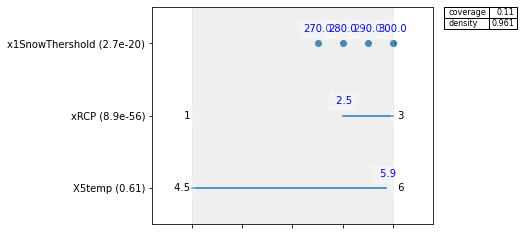

In [43]:
# Saeed : explore the inspect effect
box2.inspect(10)
box2.inspect(10, style='graph')
plt.show()

x1SnowThershold [290.0, 300.0, 270.0, 280.0, 260.0, 200.0, 240.0, 250.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


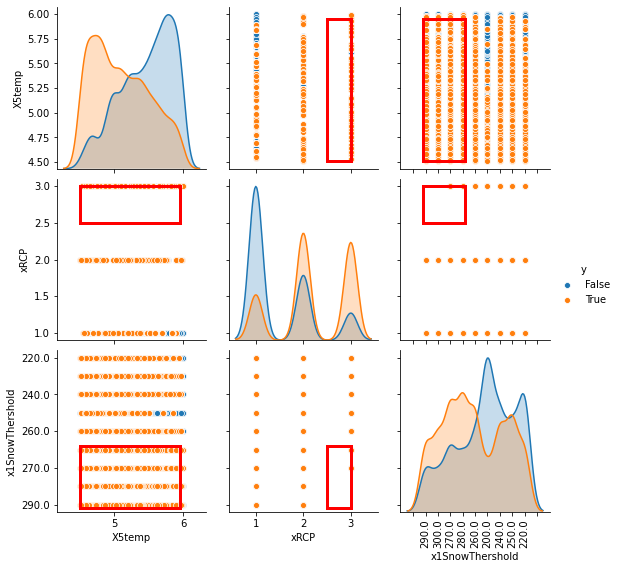

In [44]:
# fig, axs = plt.subplots()
axs2 = box2.show_pairs_scatter(10)
plt.show()
axs2.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_.svg'), format='svg', dpi=300)

### Artifical snow analysis

In [45]:
x = experiments
y = outcomes['S_Ave_ArtSnow'] < 60
prim_alg = prim.Prim(x, y, threshold=0.8)
box3 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 2655 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.9767441860465116, mass: 0.215, coverage: 0.711864406779661, density: 0.9767441860465116 restricted_dimensions: 3


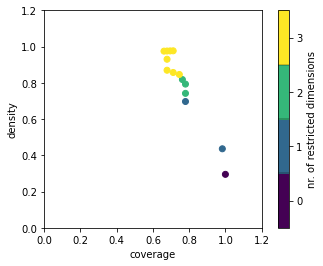

In [46]:
box3.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.779661
density     0.793103
id                 4
mass            0.29
mean        0.793103
res_dim            2
Name: 4, dtype: object

              box 4                                          
                min       max                       qp values
X6tempArt -1.999175 -1.140785  [-1.0, 1.0377476527948525e-28]
xRCP       2.500000  3.000000                     [0.0, -1.0]



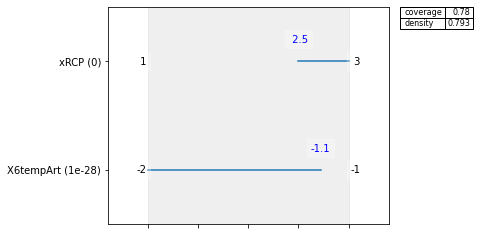

In [47]:
# Saeed : explore the inspect effect
box3.inspect(4)
box3.inspect(4, style='graph')
plt.show()

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


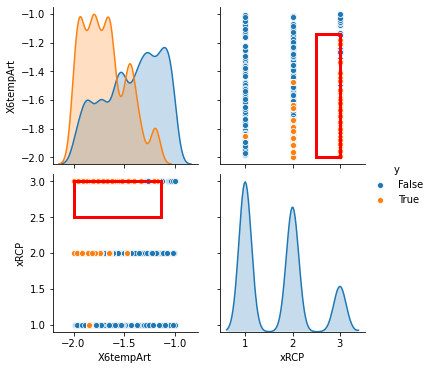

In [48]:
#fig, axs = plt.subplots()
axs4 = box3.show_pairs_scatter(4)
plt.show()
axs4.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial_40.svg'), format='tiff', dpi=300)

### Likelihood of Survival analysis

In [49]:
x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.5
prim_alg = prim.Prim(x, y, threshold=0.7)
box4 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 5651 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.09533333333333334, coverage: 0.15183153424172713, density: 1.0 restricted_dimensions: 4


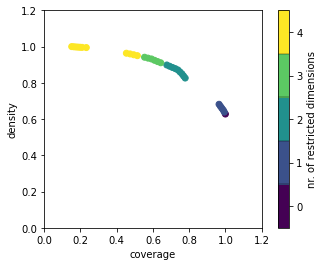

In [50]:
box4.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

coverage    0.738099
density     0.871136
id                10
mass           0.532
mean        0.871136
res_dim            2
Name: 10, dtype: object

                                                   box 10  \
                                                      min   
xRCP                                                  1.5   
policy  {0, 1, 2, 4, 5, 6, 7, 8, 10, 11, 13, 14, 15, 1...   

                                                           \
                                                      max   
xRCP                                                    3   
policy  {0, 1, 2, 4, 5, 6, 7, 8, 10, 11, 13, 14, 15, 1...   

                                         
                              qp values  
xRCP    [2.0745791027570153e-135, -1.0]  
policy   [1.9628707266037493e-75, -1.0]  



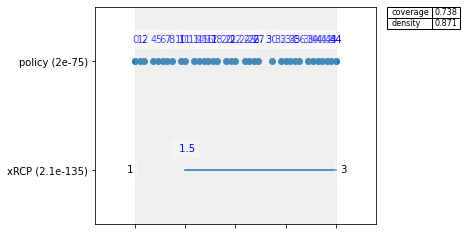

In [51]:
# Saeed : explore the inspect effect
box4.inspect(10)
box4.inspect(10, style='graph')
plt.show()

policy [0, 1, 2, 4, 5, 6, 7, 8, 10, 11, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 30, 32, 33, 34, 35, 36, 38, 39, 40, 41, 42, 43, 44, 3, 37, 9, 12, 19, 23, 28, 29, 31]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


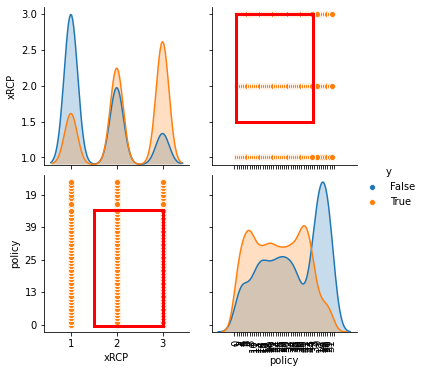

In [52]:
#fig, axs = plt.subplots()
axs3 = box4.show_pairs_scatter(10)
plt.show()
axs3.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Tipping points analysis

In [53]:
x = experiments
y = outcomes['tipping_points'] < 15
prim_alg = prim.Prim(x, y, threshold=0.8)
box5 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 972 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.8022222222222222, mass: 0.05, coverage: 0.3713991769547325, density: 0.8022222222222222 restricted_dimensions: 6


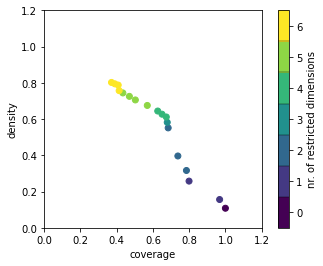

In [54]:
box5.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.408436
density     0.787698
id                15
mass           0.056
mean        0.787698
res_dim            6
Name: 15, dtype: object

                                                            box 15  \
                                                               min   
xRCP                                                             1   
xGoodDays                                             {60.0, 70.0}   
x1SnowThershold         {260.0, 200.0, 270.0, 280.0, 250.0, 220.0}   
policy           {0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...   
Xfactor1                                                   0.87454   
X5temp                                                     4.62637   

                                                                    \
                                                               max   
xRCP                                                           1.5   
xGoodDays                                             {60.0, 70.0}   
x1SnowTh

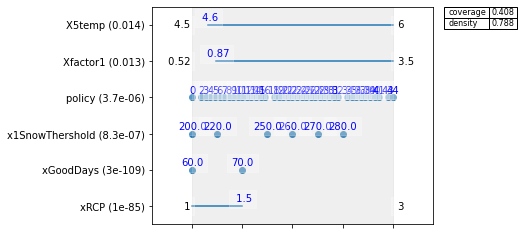

In [55]:
# Saeed : explore the inspect effect
box5.inspect(15)
box5.inspect(15, style='graph')
plt.show()

x1SnowThershold [260.0, 200.0, 270.0, 280.0, 250.0, 220.0, 240.0, 290.0, 300.0]
xGoodDays [60.0, 70.0, 80.0, 90.0, 100.0]
policy [0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 1, 42, 17, 33]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


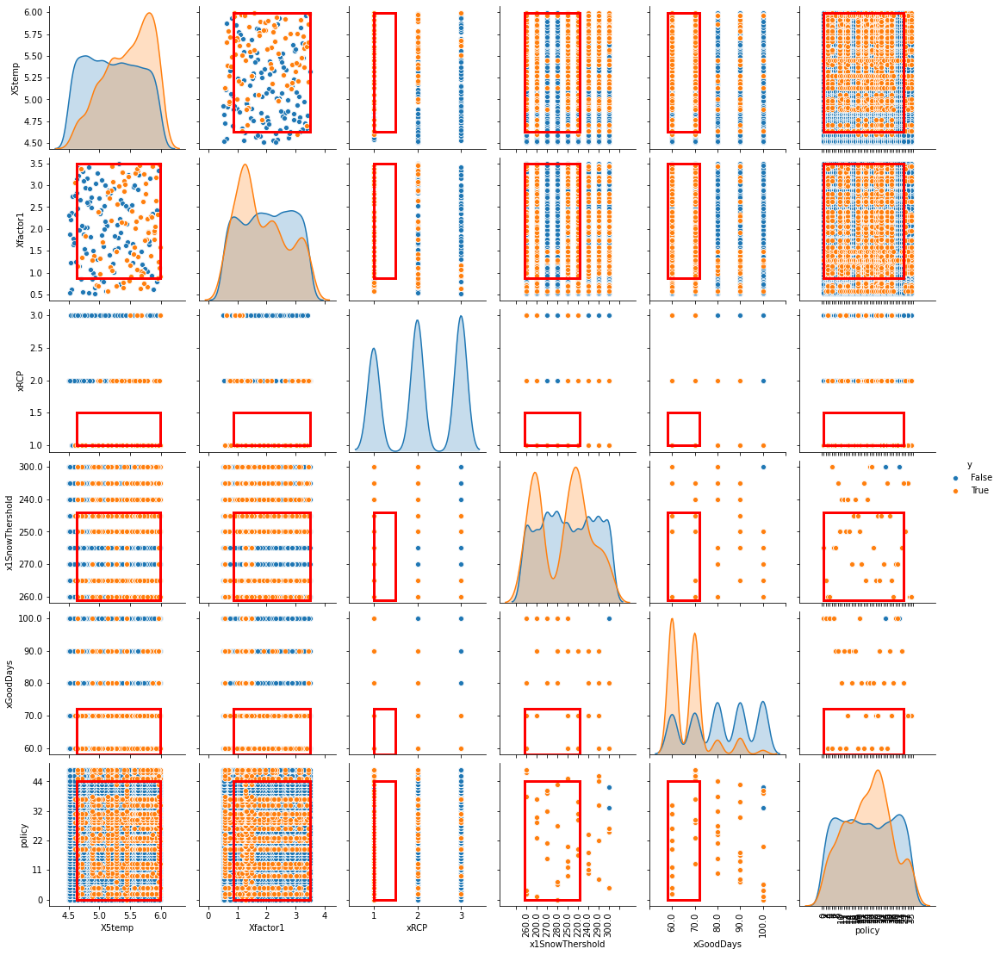

In [56]:
#fig, axs = plt.subplots()
axs5 = box5.show_pairs_scatter(15)
plt.show()

axs5.savefig(os.path.join(rootVisualization, 'multigraphs_tippingpoints.svg'), format='svg', dpi=300)

### Visualization with ema-workbench - part3

In [57]:
experiments2 = experiments
experiments2 = experiments2.pop('policy')

In [58]:
new_dict_experiments = {key:val for key, val in experiments2.items() if key != 'policy'} 

In [59]:
sns.set(font_scale=1.5)

ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.14,linecolor="grey",
                  cbar_kws={'label': 'features ranks','shrink': 0.1})

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


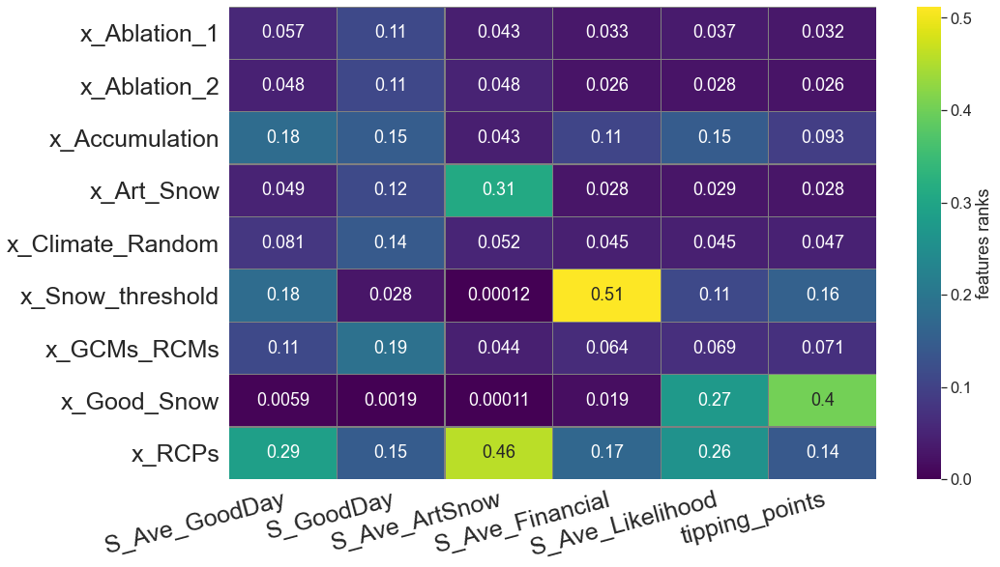

In [60]:
from ema_workbench.analysis import feature_scoring

fig6, ax6 = plt.subplots(figsize=(15,9))

x = experiments
#x = new_dict_experiments
#Y = outcomes
Y = new_dict
fs = feature_scoring.get_feature_scores_all(x, Y)
ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.28,linecolor="grey",
                  cbar_kws={'label': 'features ranks'})

# Rotate the tick labels and set their alignment.
plt.setp(ax6.get_xticklabels(), rotation=15, size = 25, ha="right",
         rotation_mode="anchor")

ylabels = ['x_Ablation_1', 'x_Ablation_2', 'x_Accumulation', 'x_Art_Snow', 'x_Climate_Random', 'x_Snow_threshold', 'x_GCMs_RCMs', 'x_Good_Snow', 'x_RCPs']
ax6.set_yticklabels(ylabels)
plt.setp(ax6.get_yticklabels(), rotation=0, size = 25, ha="right", rotation_mode="anchor")

#ax6.legend(size=13)

plt.show()

fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=300)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.tiff'), format='tiff', dpi=150)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.jpg'), format='jpg', dpi=150)

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

[MainProcess/INFO] model dropped from analysis because only a single category


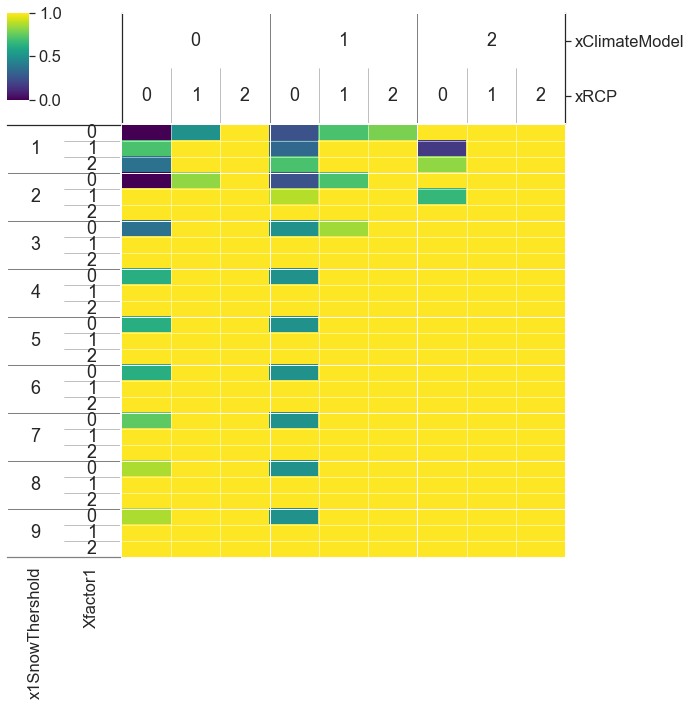

In [61]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_GoodDay'] < 70
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


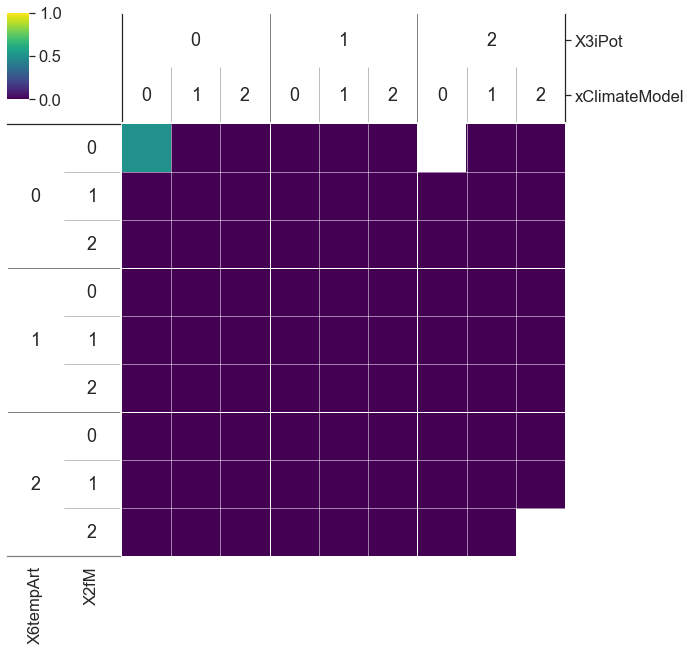

In [62]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_ArtSnow'] < 50
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=300)

[MainProcess/INFO] model dropped from analysis because only a single category


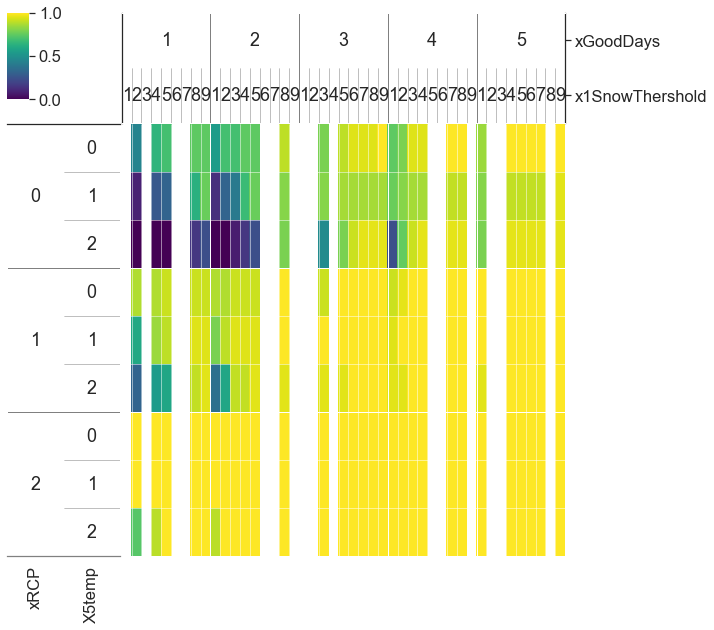

In [63]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.6
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

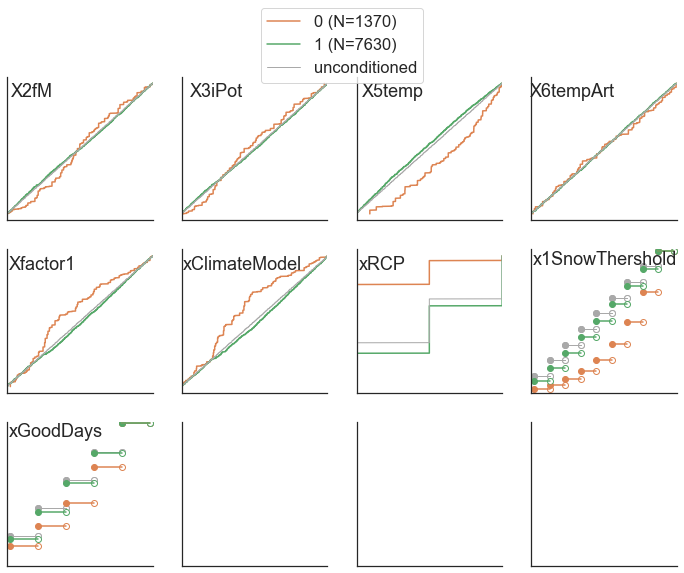

In [64]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_GoodDay'] < 60
fig10 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig10.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

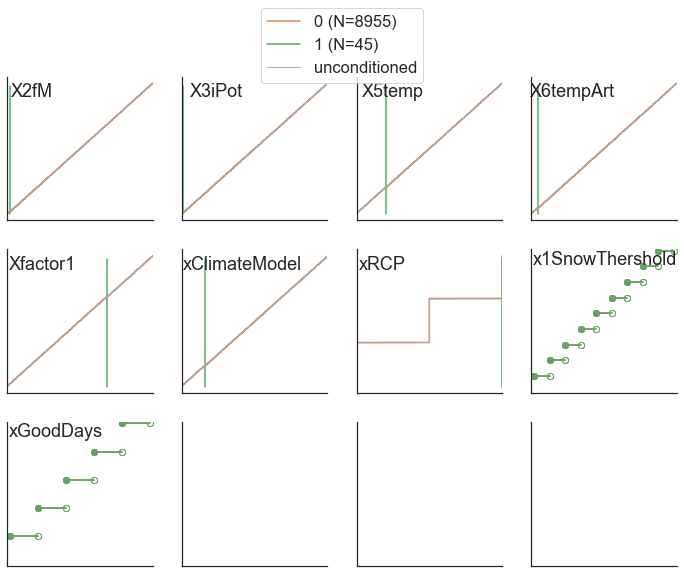

In [65]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_ArtSnow'] < 50
fig12 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig12.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

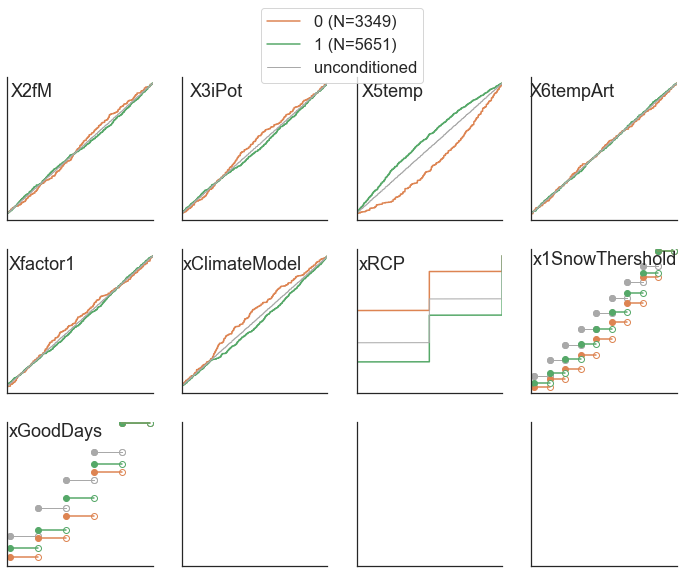

In [66]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_Likelihood'] < 0.5
fig11 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

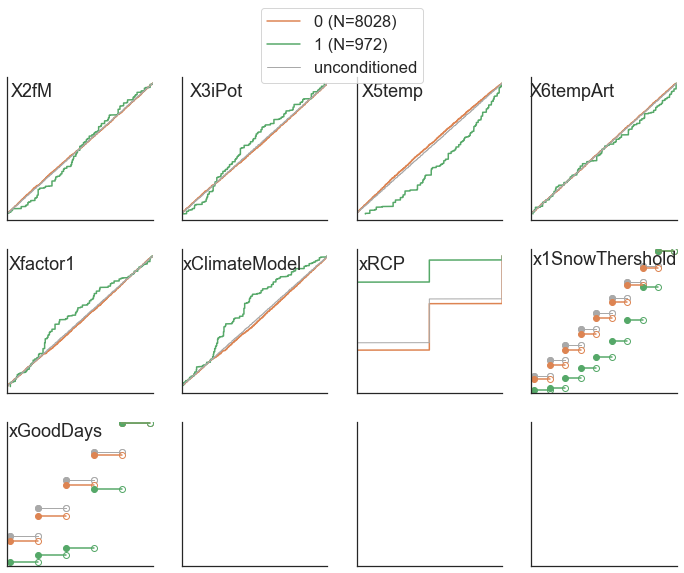

In [67]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['tipping_points'] < 15
fig11_2 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11_2.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_tipping_points.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

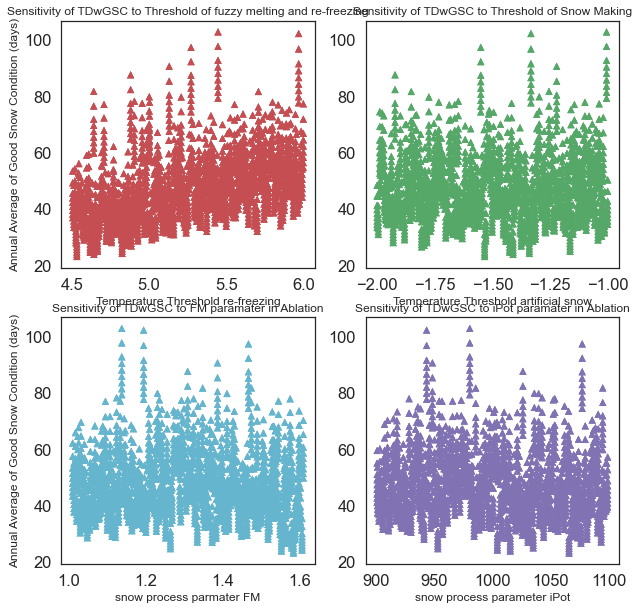

In [68]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig13, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing", size = 12)
axs[0,1].set_xlabel("Temperature Threshold artificial snow", size = 12)
axs[1,0].set_xlabel("snow process parmater FM",size = 12)
axs[1,1].set_xlabel("snow process parameter iPot", size = 12)


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing', size = 12)
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making', size = 12)
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation', size = 12)
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation', size = 12)


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig13.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

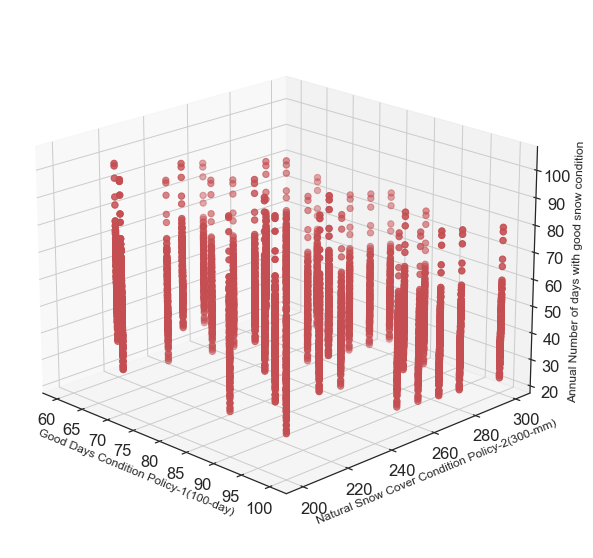

In [69]:
from mpl_toolkits.mplot3d import Axes3D 
fig14 = plt.figure(figsize=(15,10))
ax = fig14.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)', size = 12)
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)', size = 12)
ax.set_zlabel('Annual Number of days with good snow condition', size = 12)


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig14.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

In [70]:
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.580014,1051.788559,5.127577,-1.146400,2.835871,0.516809,1.0,280.0,100.0,0,0,UZHModel,47.993445,6,77.391857,48.023429,59.437107,57.823179,70.404357,131.126893,35.404821,43.851179,68.867893,8.400107,42.198214,95.818893,112.911250,79.838929,84.844393,70.191393,50.736857,73.943286,59.714321,66.783821,...,77.811536,36.934107,43.044286,29.569286,68.191179,61.666071,105.603357,39.014714,58.526464,35.605393,5.129250,25.485286,24.224536,37.448607,29.275179,85.545893,15.420214,6.384071,22.945643,48.821393,105.784321,39.088643,10.968929,83.434857,43.755571,16.722607,74.807429,43.632393,14.524286,34.046714,76.685763,1.795847,0.399586,34.0
1,1.207303,997.452394,5.797032,-1.987439,1.943691,0.397520,1.0,280.0,100.0,1,0,UZHModel,56.221079,4,46.790143,29.780679,147.864464,68.187857,61.555393,52.139679,28.287107,56.865357,87.690500,76.095179,80.042857,27.737643,37.249964,67.556429,63.251214,38.627750,39.938500,111.806036,42.502893,40.399071,...,22.933250,31.382786,26.245964,72.123857,44.495429,107.489750,81.989714,29.677000,17.204750,44.223393,2.727143,80.707643,26.153000,16.583143,20.344429,57.544250,113.396893,37.103964,33.044857,23.032286,68.543250,32.620607,84.798036,69.220607,80.544393,62.300536,4.385786,86.004964,60.462679,70.526286,62.469068,2.126864,0.465437,32.0
2,1.292598,973.208451,5.997128,-1.037563,1.574825,0.836672,1.0,280.0,100.0,2,0,UZHModel,58.241894,9,22.641607,32.393429,40.506143,87.109571,63.342714,99.909929,65.528321,57.173786,39.044714,91.853786,86.046071,105.235964,110.801429,77.881107,91.662893,80.820107,73.965821,41.609321,17.125143,40.852607,...,77.129000,52.264107,9.782071,40.177179,100.150071,48.526321,76.205214,118.633500,36.565750,93.117179,97.543893,24.862286,97.759429,54.911571,51.753571,76.606393,52.668500,84.333679,44.327036,48.081643,65.946607,36.827536,37.564143,35.211036,88.786750,32.531893,52.998357,33.220143,63.511179,33.630036,79.170169,2.197712,0.488322,34.0
3,1.239612,1009.941829,5.532630,-1.166626,2.548417,0.004587,3.0,280.0,100.0,3,0,UZHModel,41.177765,37,68.090071,130.849286,83.825964,42.144321,44.509607,84.278500,133.822000,60.103000,67.309607,63.860464,71.595536,68.985071,98.289929,66.213929,55.942429,91.949893,68.374607,83.540929,54.885429,68.759500,...,11.162250,10.053357,7.472250,19.373786,14.828071,10.288286,30.327714,58.340607,41.558286,5.416000,10.341071,25.977286,7.237214,10.034857,10.526643,34.327429,11.476000,3.952071,12.669464,5.675393,6.638679,22.499714,9.716536,6.251536,0.849536,16.021643,12.090179,4.636143,0.656143,3.457929,61.396102,1.535932,0.342496,34.0
4,1.146874,1048.777834,5.261046,-1.473425,1.550145,0.137789,1.0,280.0,100.0,4,0,UZHModel,49.902018,2,30.070393,121.801714,100.325357,35.999286,44.621071,92.242286,78.109286,81.233929,78.427071,64.866750,43.955286,41.756714,69.921250,55.025786,25.452786,66.694964,64.700107,57.656393,33.069393,59.879321,...,44.556607,38.360857,19.248036,19.857357,17.452643,119.955321,138.251857,63.810179,34.429036,11.963571,35.492036,65.077143,37.485643,47.058321,31.599429,35.702179,37.483321,30.615321,8.443357,35.655893,38.538000,24.570250,45.794321,17.244214,17.104929,51.310500,41.341643,18.410750,12.320893,44.015786,68.677203,1.885254,0.411964,33.0


# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [71]:
df_final_ema.tail()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
8995,1.538204,1033.907086,5.971959,-1.478363,1.120814,0.749622,2.0,290.0,80.0,195,44,UZHModel,43.077549,30,85.360483,97.009621,32.521517,23.078724,105.698172,74.587241,60.945241,27.892448,45.382586,55.596241,75.566862,98.677966,37.628310,49.699897,37.170552,38.959517,74.921379,83.639138,45.797690,54.656483,...,4.204759,34.628759,9.977724,18.807759,15.165862,53.907103,14.370862,67.115483,20.026448,20.515172,7.300690,1.910241,43.185414,11.287931,31.821862,31.817724,5.902897,7.346655,32.330759,3.221724,29.134241,11.808793,26.075379,4.649379,2.200690,28.529621,62.809241,16.980931,16.036828,10.275552,58.615339,1.536102,0.430166,29.0
8996,1.056366,1074.134065,5.622476,-1.507938,2.903391,0.858208,2.0,290.0,80.0,196,44,UZHModel,46.863962,32,22.157724,114.773034,77.757655,64.260621,135.379207,37.537448,83.135069,32.116828,143.118138,42.850345,35.716586,112.656034,49.037966,91.704690,34.783414,45.785034,98.574138,61.502517,15.656517,25.831655,...,11.143897,61.778345,56.651759,37.387000,36.602517,36.859897,38.817897,33.691690,10.267000,26.139207,8.473517,3.479621,16.972586,21.951103,11.859103,28.703552,1.492103,9.211793,10.198138,55.361414,83.397862,27.726552,45.776310,14.258069,6.801310,14.419690,29.076759,1.587552,16.794655,14.161655,63.637542,1.688390,0.459801,24.0
8997,1.088471,959.818758,5.369724,-1.536070,3.297858,0.299645,1.0,290.0,80.0,197,44,UZHModel,49.232668,3,40.134345,92.774483,48.223138,42.999621,3.232034,37.805069,78.981552,77.195862,48.254414,27.070379,43.484069,116.447517,73.160793,35.893586,34.131310,98.543655,84.006897,63.216310,71.555862,53.459621,...,28.552793,6.241828,67.801483,13.891931,42.934414,51.902483,106.955276,97.302379,18.950000,24.853000,45.553517,26.378172,16.569897,26.717931,64.174069,27.429034,32.562310,37.491517,15.014241,32.200621,53.406690,27.630724,67.468759,16.284759,23.381345,26.261241,56.304069,58.230448,86.282655,115.813241,67.411949,1.763814,0.493649,31.0
8998,1.565046,967.654438,5.191828,-1.086201,2.880448,0.154449,2.0,290.0,80.0,198,44,UZHModel,37.765721,15,82.201931,32.185586,57.256069,77.112414,83.709759,37.955448,46.787448,49.242793,54.571931,33.062069,56.628793,36.780862,34.122345,58.663138,57.070862,85.772034,47.543655,49.070586,38.638310,31.204793,...,5.144724,50.712931,77.503207,26.987931,26.229931,51.822483,11.676793,48.196621,49.960000,54.038207,29.962828,31.698793,12.458483,9.647414,16.892172,38.101379,3.438862,6.071931,9.970897,2.227690,31.536586,5.280000,18.304586,17.606897,4.237069,55.479552,69.799552,9.779034,32.642379,47.883724,69.443390,1.331695,0.390370,36.0
8999,1.196588,1016.214676,4.520867,-1.023636,0.538204,0.120966,2.0,290.0,80.0,199,44,UZHModel,38.334847,14,49.387759,48.558345,87.475724,14.356586,35.679897,40.429276,115.508517,31.230759,50.284034,80.418034,26.844483,50.712448,23.424103,103.753379,26.260379,68.363448,32.981793,22.690241,13.143690,20.432000,...,7.340379,24.117862,18.279828,19.774103,5.384552,29.501138,63.848241,45.679172,13.895207,98.843483,24.842379,44.725931,22.995862,29.073379,25.343207,54.665655,14.023310,24.627103,10.870379,13.999793,56.195724,37.876793,34.519931,60.953345,13.863552,29.117862,8.404586,16.089276,41.856862,14.282517,75.857288,1.360593,0.386993,31.0


In [72]:
filt_S = (df_final_ema['scenario'] == 1)
x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']

In [73]:
x_policy[1]

280.0

In [74]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.207303,997.452394,5.797032,-1.987439,1.943691,0.39752,1.0,280.0,100.0,1,0,UZHModel,56.221079,4,46.790143,29.780679,147.864464,68.187857,61.555393,52.139679,28.287107,56.865357,87.690500,76.095179,80.042857,27.737643,37.249964,67.556429,63.251214,38.627750,39.938500,111.806036,42.502893,40.399071,...,22.933250,31.382786,26.245964,72.123857,44.495429,107.489750,81.989714,29.677000,17.204750,44.223393,2.727143,80.707643,26.153000,16.583143,20.344429,57.544250,113.396893,37.103964,33.044857,23.032286,68.543250,32.620607,84.798036,69.220607,80.544393,62.300536,4.385786,86.004964,60.462679,70.526286,62.469068,2.126864,0.465437,32.0
201,1.207303,997.452394,5.797032,-1.987439,1.943691,0.39752,1.0,250.0,70.0,1,1,UZHModel,62.239577,4,52.404960,33.354360,154.615520,76.370400,68.942040,58.396440,31.681560,63.689200,97.436840,85.226600,89.648000,31.066160,41.719960,75.663200,70.841360,43.263080,44.731120,117.904840,47.603240,45.246960,...,25.685240,35.148720,29.395480,80.778720,49.834880,113.878840,91.828480,33.238240,19.269320,49.530200,3.054400,90.392560,29.291360,18.573120,22.785760,64.449560,118.594080,41.556440,37.010240,25.796160,76.768440,36.535080,94.973800,76.450480,87.931520,69.776600,4.912080,95.954360,67.718200,78.989440,62.469068,2.593559,0.641852,13.0
401,1.207303,997.452394,5.797032,-1.987439,1.943691,0.39752,1.0,200.0,100.0,1,2,UZHModel,74.471759,4,65.506200,41.692950,167.429000,90.328850,86.105650,72.995550,39.601950,79.611500,113.093000,106.533250,110.559050,38.832700,52.149950,92.509950,88.551700,54.078850,55.913900,127.264000,59.504050,56.558700,...,32.106550,43.935900,36.744350,100.889000,62.293600,123.276600,114.785600,41.547800,24.086650,61.912750,3.818000,108.374400,36.614200,23.216400,28.482200,80.561950,127.948000,51.945550,46.262800,32.245200,94.267300,45.668850,117.637100,84.252800,99.628750,87.220750,6.140100,115.337600,84.647750,98.622250,62.469068,3.883051,0.592059,21.0
601,1.207303,997.452394,5.797032,-1.987439,1.943691,0.39752,1.0,260.0,60.0,1,3,UZHModel,60.137714,4,50.389385,32.071500,152.576385,73.433077,66.290423,56.150423,30.463038,61.239615,94.043654,81.948654,86.200000,29.871308,40.115346,72.753077,68.116692,41.599115,43.010692,116.212385,45.772346,43.506692,...,24.697346,33.796846,28.264885,77.671846,47.918154,111.877692,88.296615,31.959846,18.528192,47.625192,2.936923,86.915923,28.164769,17.858769,21.909385,61.970731,116.985308,39.958115,35.586769,24.804000,73.815808,35.129885,91.320962,74.227962,85.418769,67.092885,4.723154,92.459192,65.113654,75.951385,62.469068,2.424831,0.674424,8.0
801,1.207303,997.452394,5.797032,-1.987439,1.943691,0.39752,1.0,260.0,100.0,1,4,UZHModel,60.137714,4,50.389385,32.071500,152.576385,73.433077,66.290423,56.150423,30.463038,61.239615,94.043654,81.948654,86.200000,29.871308,40.115346,72.753077,68.116692,41.599115,43.010692,116.212385,45.772346,43.506692,...,24.697346,33.796846,28.264885,77.671846,47.918154,111.877692,88.296615,31.959846,18.528192,47.625192,2.936923,86.915923,28.164769,17.858769,21.909385,61.970731,116.985308,39.958115,35.586769,24.804000,73.815808,35.129885,91.320962,74.227962,85.418769,67.092885,4.723154,92.459192,65.113654,75.951385,62.469068,2.424831,0.494184,30.0
1001,1.207303,997.452394,5.797032,-1.987439,1.943691,0.39752,1.0,300.0,60.0,1,5,UZHModel,52.645276,4,43.670800,27.795300,142.828533,63.642000,57.451700,48.663700,26.401300,53.074333,81.860167,71

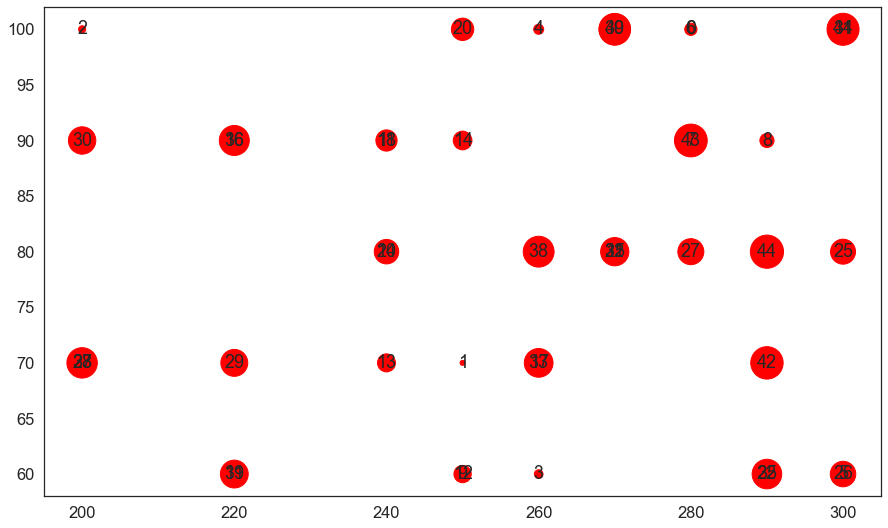

In [75]:
#x_policy = x1SnowThershold 
#y_policy = xGoodDays 

#ranking = np.random.normal(size=9000)
#scenarios = df_final_ema['policy'].values


fig, ax_n = plt.subplots(figsize=(15,9))


x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']
#colors = np.random.rand(N)


# Because the price is much too small when being provided as size for ``s``,
# we normalize it to some useful point sizes, s=0.3*(price*3)**2
ax_n.scatter(x_policy, y_policy, s = scenarios * 25, c = 'red' , cmap="Spectral")

for x_pos, y_pos, label in zip(x_policy, y_policy, scenarios):
    ax_n.annotate(label,
                xy=(x_pos, y_pos),
                xytext=(0, 0),
                textcoords='offset points',
                ha='center',
                va='center')

plt.show()

### Defining the Q0.9 and Q0.1 databases

In [76]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[26.65375564]
[36.86637444]
[54.1980537]
[73.23182197]
[88.87440455]
(118, 1)
[0.95]
[1.46]
[2.215]
[3.06]
[4.001]
(118, 1)
[58.955]
[63.8525]
[70.8]
[79.7525]
[85.32]
(118, 1)
[32.43848148]
[46.20458889]
[68.05865741]
[93.92518085]
[100.]
(118, 1)


In [77]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000


In [78]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[3, 0, 1:2])
print(matrix_GoodDays[4].shape)

(9000, 119, 1)
['isOverSnow_sc_85_13']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [79]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [80]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

dfq50_Art_26 = pd.DataFrame(q50_years_Art_26)
dfq50_Art_26.columns = ['median26']
dfq50_Art_45 = pd.DataFrame(q50_years_Art_45)
dfq50_Art_45.columns = ['median45']
dfq50_Art_85 = pd.DataFrame(q50_years_Art_85)
dfq50_Art_85.columns = ['median85']

dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
dfq90_Art_26.columns = ['median26']
dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
dfq90_Art_45.columns = ['median45']
dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
dfq90_Art_85.columns = ['median85']

dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
dfq10_Art_26.columns = ['median26']
dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
dfq10_Art_45.columns = ['median45']
dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [81]:
dfq50_26.head()

,median26
0,51.701448
1,58.945400
2,82.203345
3,40.873500
4,71.899500


In [82]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [83]:
dfAllAverages.head()

,median26,median45,median85
0,51.701448,54.851571,55.602588
1,58.945400,69.307100,65.216006
2,82.203345,66.260500,85.295177
3,40.873500,46.855136,38.349194
4,71.899500,73.695808,63.561067


In [84]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[26.65375564]
[36.86637444]
[54.1980537]
[73.23182197]
[88.87440455]
(118, 1)
*** RCP2.6***
[26.45166667]
[33.68611538]
[51.70144828]
[73.56715385]
[91.04592857]
(118, 1)
*** RCP4.5***
[24.89088]
[36.4634]
[54.85157143]
[75.93415385]
[91.667]
(118, 1)
*** RCP8.5***
[30.65726667]
[39.95285185]
[55.6025882]
[70.65760714]
[83.48723077]
(118, 1)


In [85]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[0.95]
[1.46]
[2.215]
[3.06]
[4.001]
(118, 1)
*** RCP2.6***
[0.9]
[1.38]
[2.12]
[3.06]
[4.01]
(118, 1)
*** RCP4.5***
[0.93]
[1.42]
[2.26]
[3.12]
[4.09]
(118, 1)
*** RCP8.5***
[1.12]
[1.57]
[2.25]
[3.]
[3.84]
(118, 1)


#### Set the parameters of making figure

In [86]:
p_Step = 20
alpha_Fade = 0.11

### RCP 2.6 Number of days with Good Snow Condition over the time

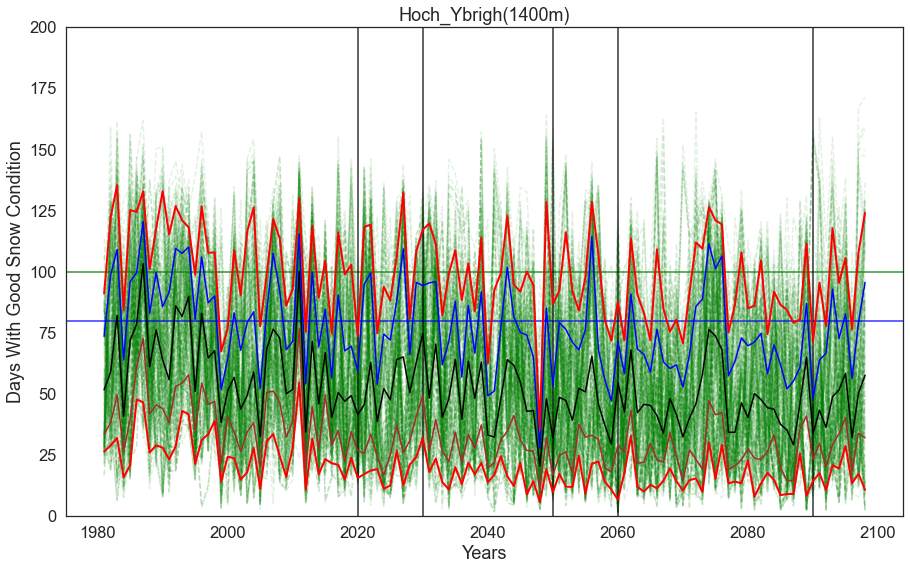

In [87]:
fig15, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig15.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

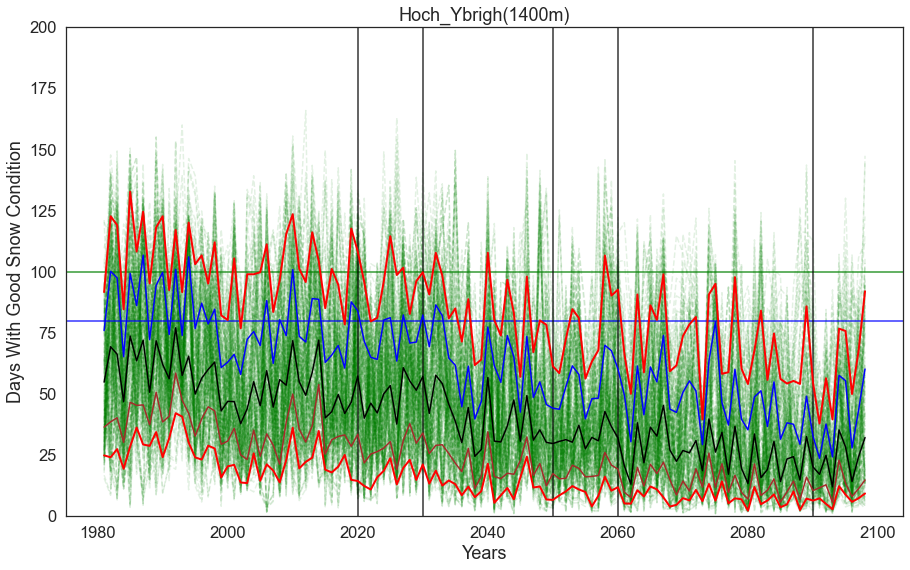

In [88]:
fig16, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig16.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

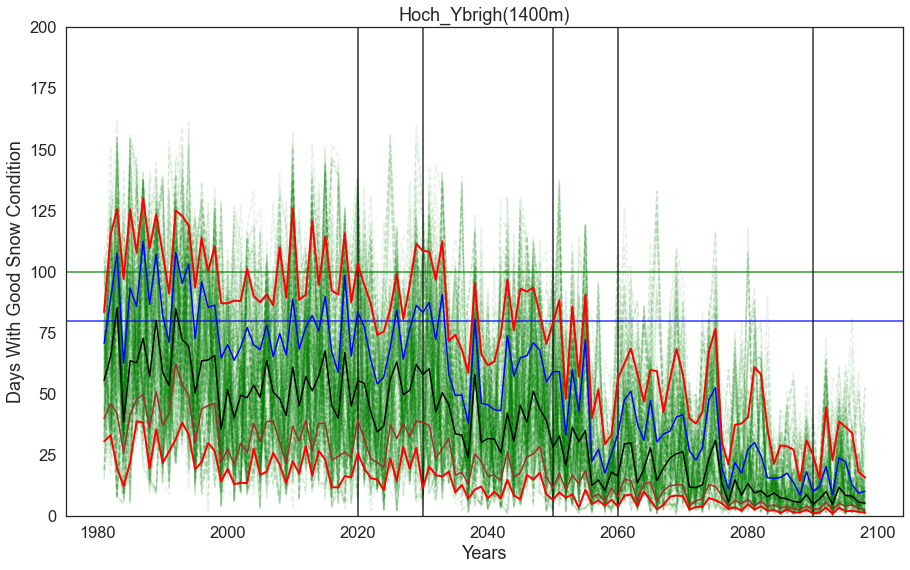

In [89]:
fig17, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig17.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

In [90]:
title_Figs = 'case4_Champex (1486-2194m), RCP2.6'

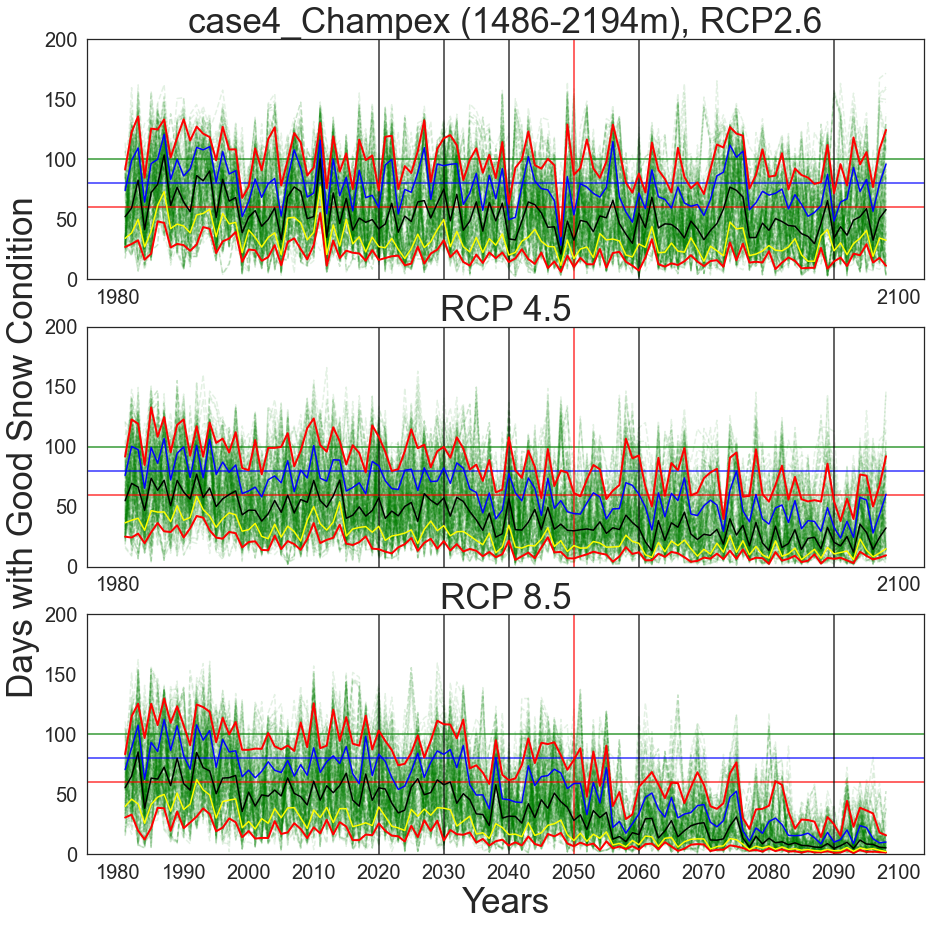

In [91]:
fig18, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)    

    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[0].axhline(y=60, color='red', alpha=0.8)

axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=60, color='red', alpha=0.8)

axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=60, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =200)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Days with Good Snow Condition', fontsize=35)

axs[2].set_ylim(bottom=0, top =200)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)

fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.tiff'), format='tiff', dpi=150)

plt.show()

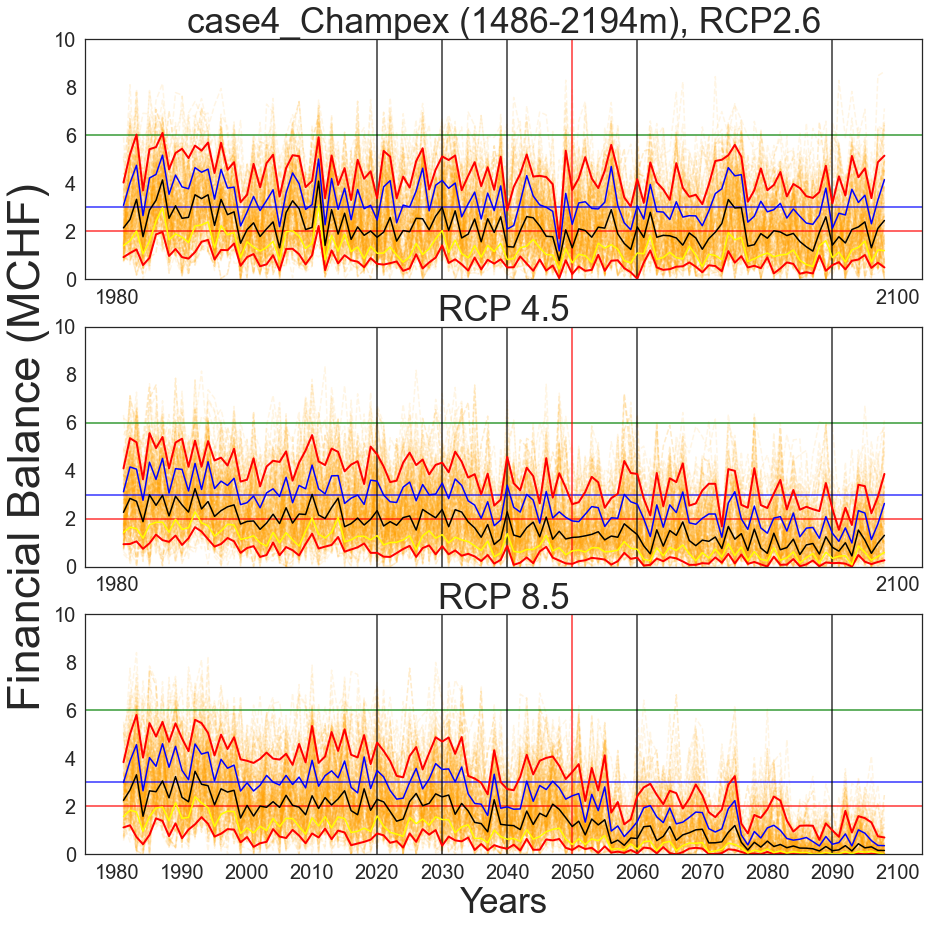

In [92]:
fig19, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_fin26), p_Step):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin45), p_Step):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin85), p_Step):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)    

axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=6, color='green', alpha=0.8)
axs[0].axhline(y=3, color='blue', alpha=0.8)
axs[0].axhline(y=2, color='red', alpha=0.8)

axs[1].axhline(y=6, color='green', alpha=0.8)
axs[1].axhline(y=3, color='blue', alpha=0.8)
axs[1].axhline(y=2, color='red', alpha=0.8)

axs[2].axhline(y=6, color='green', alpha=0.8)
axs[2].axhline(y=3, color='blue', alpha=0.8)
axs[2].axhline(y=2, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =10)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Balance (MCHF)', fontsize=45)

axs[2].set_ylim(bottom=0, top =10
               )
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)


fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)
fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.tiff'), format='tiff', dpi=150)


plt.show()

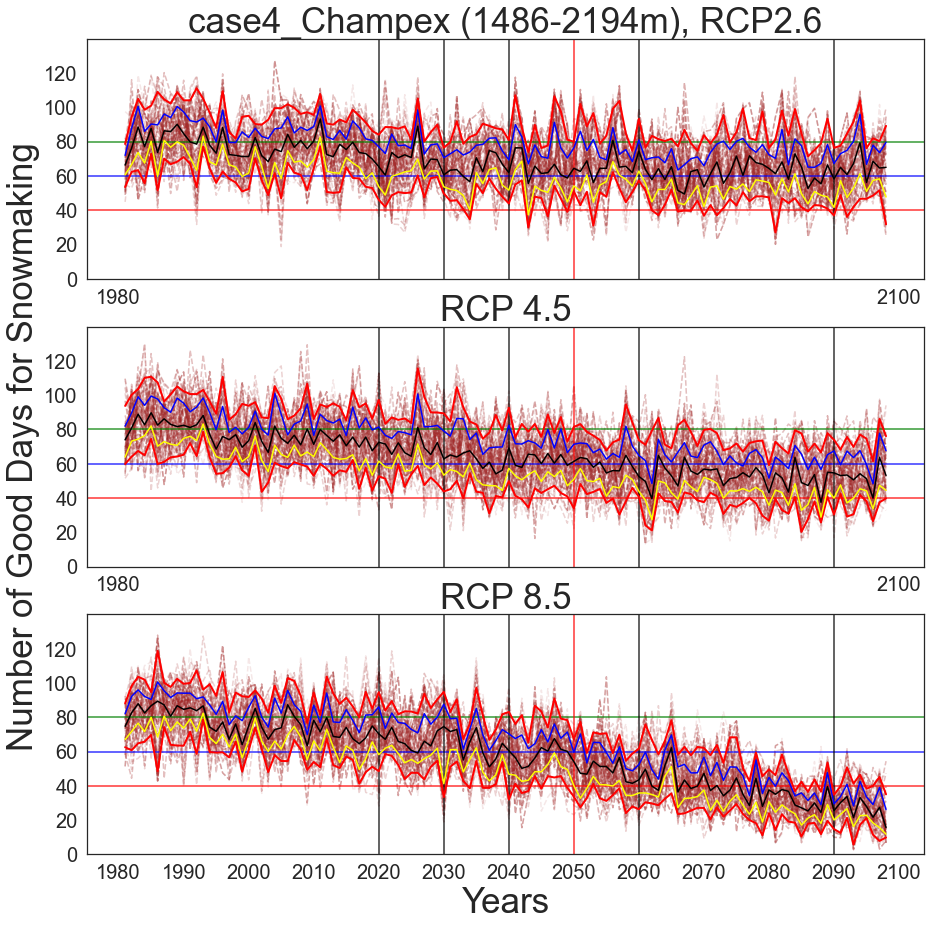

In [93]:
fig20, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Art26), p_Step):
    a = matrix_Art26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art45), p_Step):
    a = matrix_Art45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art85), p_Step):
    a = matrix_Art85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)    

    
    
    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=60, color='blue', alpha=0.8)
axs[0].axhline(y=40, color='red', alpha=0.8)

axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=60, color='blue', alpha=0.8)
axs[1].axhline(y=40, color='red', alpha=0.8)

axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=60, color='blue', alpha=0.8)
axs[2].axhline(y=40, color='red', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Art_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Art_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Art_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Art_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Art_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Art_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Art_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Art_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Art_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Art_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Art_85, color='red', linewidth = 2, alpha=1)



axs[0].set_ylim(bottom=0, top =140)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)

axs[1].set_ylim(bottom=0, top =140)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Number of Good Days for Snowmaking', fontsize=35)

axs[2].set_ylim(bottom=0, top =140)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)


fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.svg'), format='svg', dpi=300)
fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.tiff'), format='tiff', dpi=150)


plt.show()

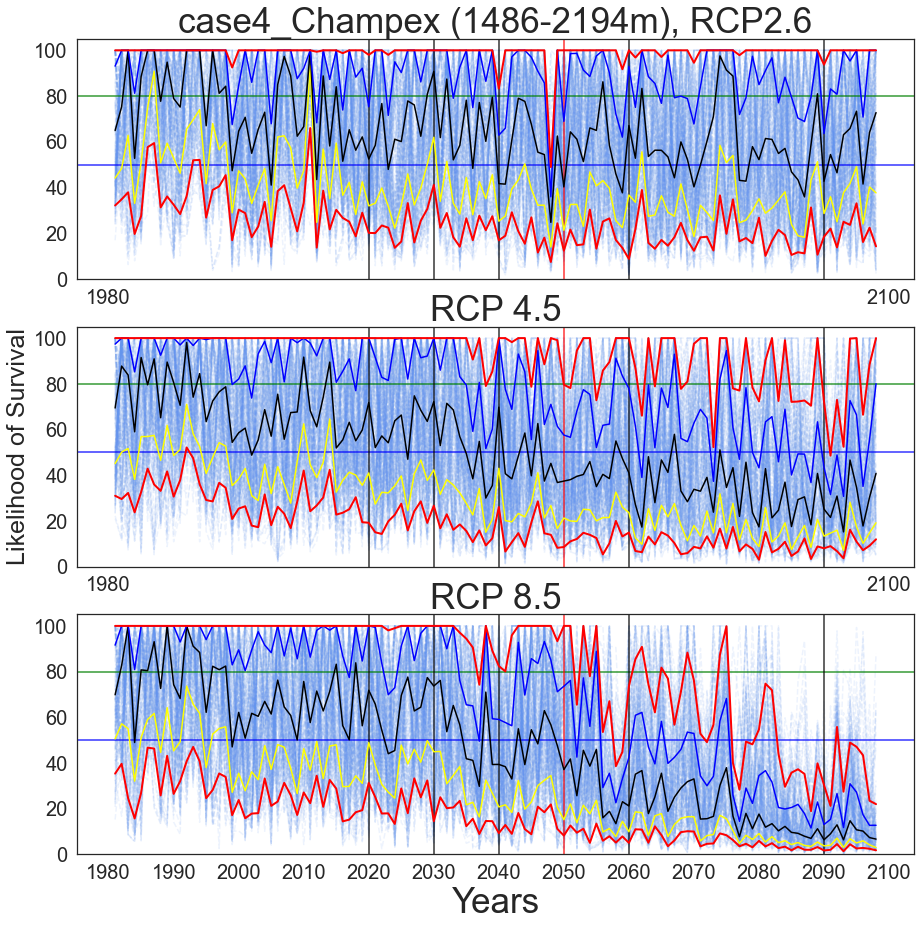

In [94]:
fig21, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), p_Step):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like45), p_Step):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like85), p_Step):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)    


axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)    
    

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Likelihood of Survival', fontsize=12)

axs[1].set_ylim(bottom=0, top =105)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival', fontsize=25)

axs[2].set_ylim(bottom=0, top =105)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)


axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Likelihood of Survival', fontsize=12)


fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)
fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.tiff'), format='tiff', dpi=150)


plt.show()

In [95]:
dfAllAverages.head()

,median26,median45,median85
0,51.701448,54.851571,55.602588
1,58.945400,69.307100,65.216006
2,82.203345,66.260500,85.295177
3,40.873500,46.855136,38.349194
4,71.899500,73.695808,63.561067


### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

In [96]:
title_Figs2 = 'Champex'

In [97]:
y_axis = np.arange(1981, 2100, step= 20)

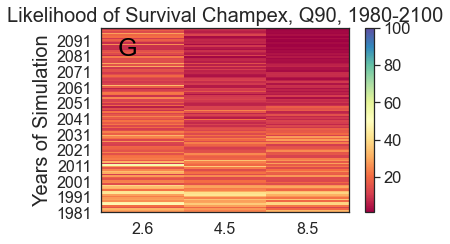

In [99]:
from matplotlib.ticker import FuncFormatter


fig22, (ax3) = plt.subplots(1, 1, figsize=(9,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='Spectral', vmin=1, vmax=100, offsets = 0.35)
cb3 = fig22.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


#ax3.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax3.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q90, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax3.text(0.2, 100, 'G', color = 'Black', fontsize=25)

fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)
fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.tiff'), format='tiff', dpi=300)


fig22.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

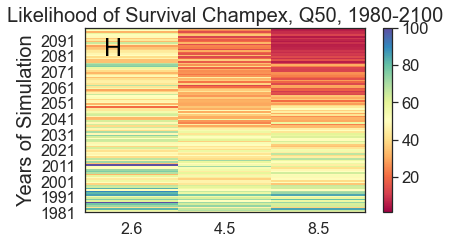

In [100]:
from matplotlib.ticker import FuncFormatter


fig23, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='Spectral' ,vmin=1, vmax=100, offsets = .35)
cb4 = fig23.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q50, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'H', color = 'Black', fontsize=25)


fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.svg'), format='svg', dpi=300)
fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.tiff'), format='tiff', dpi=300)
#fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.jpg'), format='jpg', dpi=300)


fig23.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

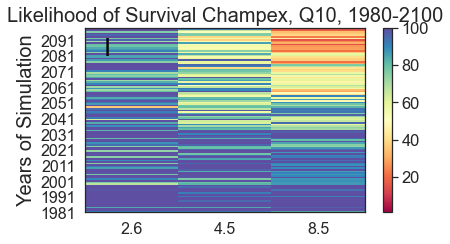

In [101]:
from matplotlib.ticker import FuncFormatter


fig24, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='Spectral' ,vmin=1, vmax=100)
cb4 = fig24.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q10, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'I', color = 'Black', fontsize=25)


fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.svg'), format='svg', dpi=300)
fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.tiff'), format='tiff', dpi=300)



fig24.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [102]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
(9000, 119, 2)


In [103]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [104]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [105]:
df26_all.head(7)
df26_all.to_csv(os.path.join(rootVisualization, 'df26_all.csv'), index = False)

In [106]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_sc_45_3'], dtype='<U46')

In [107]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [108]:
df45_all.head(7)
df45_all.to_csv(os.path.join(rootVisualization, 'df45_all.csv'), index = False)

In [109]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [110]:
df85_all.head(7)
df85_all.to_csv(os.path.join(rootVisualization, 'df85_all.csv'), index = False)

In [111]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

In [112]:
df26_all_fin = pd.DataFrame((matrix_fin26[0][1:,0:1]), columns=matrix_fin26[0,0,0:1])
for i in range(len(matrix_fin26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin26[i,0,1:])])
    df26_all_fin = pd.concat((df26_all_fin, b), axis = 1)

In [113]:
df26_all_fin.head(7)

,Season,sc_1_['Money_sc_26_7'],sc_2_['Money_sc_26_5'],sc_3_['Money_sc_26_2'],sc_4_['Money_sc_26_7'],sc_5_['Money_sc_26_5'],sc_6_['Money_sc_26_10'],sc_7_['Money_sc_26_3'],sc_8_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_9_['Money_sc_26_3'],sc_10_['Money_sc_26_2'],sc_11_['Money_sc_26_7'],sc_12_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_13_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_14_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_15_['Money_sc_26_8'],sc_16_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_17_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_18_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_19_['Money_sc_26_2'],sc_20_['Money_sc_26_6'],sc_21_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_22_['Money_sc_26_1'],sc_23_['Money_sc_26_7'],sc_24_['Money_sc_26_10'],sc_25_['Money_sc_26_2'],sc_26_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_27_['Money_sc_26_10'],sc_28_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_29_['Money_sc_26_7'],sc_30_['Money_sc_26_11'],sc_31_['Money_sc_26_8'],sc_32_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_33_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],...,sc_2982_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2983_['Money_sc_26_12'],sc_2984_['Money_sc_26_4'],sc_2985_['Money_sc_26_3'],sc_2986_['Money_sc_26_6'],sc_2987_['Money_sc_26_7'],sc_2988_['Money_sc_26_11'],sc_2989_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2990_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2991_['Money_sc_26_6'],sc_2992_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2993_['Money_sc_26_8'],sc_2994_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2995_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2996_['Money_sc_26_2'],sc_2997_['Money_sc_26_1'],sc_2998_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2999_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_3000_['Money_sc_26_7'],sc_3001_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3002_['Money_sc_26_4'],sc_3003_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3004_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_3005_['Money_sc_26_4'],sc_3006_['Money_sc_26_10'],sc_3007_['Money_sc_26_10'],sc_3008_['Money_sc_26_6'],sc_3009_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_3010_['Money_sc_26_2'],sc_3011_['Money_sc_26_9'],sc_3012_['Money_sc_26_10'],sc_3013_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_3014_['Money_sc_26_12'],sc_3015_['Money_sc_26_4']
0,1981-1982,3.0599999999999956,1.7900000000000014,3.4999999999999933,2.490000000000002,1.360000000000001,0.7600000000000005,0.9500000000000006,1.5700000000000012,0.8900000000000006,3.0299999999999963,2.4000000000000012,0.8100000000000005,1.7900000000000014,2.7199999999999998,1.6600000000000013,1.5800000000000012,0.6900000000000004,0.7500000000000004,2.749999999999997,1.6400000000000012,0.7500000000000004,1.1000000000000008,2.159999999999999,0.7200000000000004,2.520000000000002,1.8200000000000014,0.7400000000000004,1.8100000000000014,2.490000000000002,0.9400000000000006,2.070000000000001,1.410000000000001,1.360000000000001,...,2.34,1.0800000000000007,1.1300000000000008,0.9200000000000006,1.7600000000000013,2.7899999999999983,1.6500000000000012,2.369999999999999,2.289999999999996,2.559999999999999,3.2999999999999963,2.1999999999999997,2.0899999999999994,2.9099999999999997,3.569999999999992,1.270000000000001,1.8800000000000014,2.48,3.719999999999996,1.1500000000000008,1.0800000000000007,2.0899999999999994,0.9700000000000006,1.0900000000000007,0.7700000000000005,1.390000000000001,2.370000000000002,1.8800000000000014,4.009999999999998,4.560000000000001,0.7200000000000004,2.9499999999999975,1.380000000000001,1.8400000000000014
1,1982-1983,1.6400000000000012,1.0300000000000007,1.5800000000000012,1.5800000000000012,0.9100000000000006,1.0800000000000007,4.3800000000000034,2.090000000000001,3.269999999999996,1.470000000000001,1.310000000000001,2.1799999999999975,2.1799999999999993,3.449999999999995,1.0400000000000007,3.929999999999989,2.0400000000000005,2.199999999999998,0.5900000000000003,1.320000000000001,2.2699999999999996,3.159999999999995,1.8400000

In [114]:
df45_all_fin = pd.DataFrame((matrix_fin45[0][1:,0:1]), columns=matrix_fin45[0,0,0:1])
for i in range(len(matrix_fin45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin45[i,0,1:])])
    df45_all_fin = pd.concat((df45_all_fin, b), axis = 1)

In [115]:
df45_all_fin.head(7)

,Season,sc_1_['Money_sc_45_12'],sc_2_['Money_sc_45_6'],sc_3_['Money_sc_45_3'],sc_4_['Money_sc_45_9'],sc_5_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_6_['Money_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_7_['Money_sc_45_24'],sc_8_['Money_sc_45_15'],sc_9_['Money_sc_45_1'],sc_10_['Money_sc_45_18'],sc_11_['Money_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_12_['Money_sc_45_4'],sc_13_['Money_sc_45_2'],sc_14_['Money_sc_45_7'],sc_15_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_16_['Money_sc_45_17'],sc_17_['Money_sc_45_23'],sc_18_['Money_sc_45_1'],sc_19_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_20_['Money_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_21_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_22_['Money_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_23_['Money_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_24_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_25_['Money_sc_45_4'],sc_26_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_27_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_28_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_29_['Money_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_30_['Money_sc_45_22'],sc_31_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_32_['Money_sc_45_9'],sc_33_['Money_sc_45_6'],...,sc_2982_['Money_sc_45_22'],sc_2983_['Money_sc_45_18'],sc_2984_['Money_sc_45_1'],sc_2985_['Money_sc_45_7'],sc_2986_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_2987_['Money_sc_45_23'],sc_2988_['Money_sc_45_12'],sc_2989_['Money_sc_45_4'],sc_2990_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_2991_['Money_sc_45_5'],sc_2992_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_2993_['Money_sc_45_16'],sc_2994_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_2995_['Money_sc_45_10'],sc_2996_['Money_sc_45_7'],sc_2997_['Money_sc_45_7'],sc_2998_['Money_sc_45_24'],sc_2999_['Money_sc_45_16'],sc_3000_['Money_sc_45_9'],sc_3001_['Money_sc_45_9'],sc_3002_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_3003_['Money_sc_45_22'],sc_3004_['Money_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_3005_['Money_sc_45_24'],sc_3006_['Money_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_3007_['Money_sc_45_12'],sc_3008_['Money_sc_45_22'],sc_3009_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_3010_['Money_sc_45_15'],sc_3011_['Money_sc_45_2'],sc_3012_['Money_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_3013_['Money_sc_45_21'],sc_3014_['Money_sc_45_4'],sc_3015_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp']
0,1981-1982,1.5500000000000012,2.749999999999999,1.0200000000000007,2.3000000000000016,2.149999999999999,2.4999999999999996,1.7000000000000013,0.46000000000000024,1.2500000000000009,0.8000000000000005,2.269999999999999,2.5299999999999985,0.9200000000000006,1.1300000000000008,1.9200000000000013,1.1500000000000008,0.8800000000000006,1.300000000000001,0.5700000000000003,3.0099999999999962,1.5500000000000012,0.8500000000000005,2.5000000000000018,2.249999999999997,2.1899999999999986,1.6800000000000013,1.5500000000000012,1.2300000000000009,0.6500000000000004,1.8500000000000014,1.320000000000001,2.3600000000000017,2.430000000000002,...,2.2399999999999975,4.300000000000004,2.0000000000000013,1.280000000000001,2.2399999999999998,1.2200000000000009,1.420000000000001,3.839999999999994,1.530000000000001,1.1800000000000008,2.9999999999999942,1.0700000000000007,1.7200000000000013,3.089999999999998,3.4699999999999975,3.4699999999999975,0.8200000000000005,3.7099999999999986,2.5499999999999985,2.8300000000000014,1.6600000000000013,2.3399999999999994,2.909999999999996,2.350000000000001,2.289999999999996,1.360000000000001,2.3899999999999992,0.8300000000000005,3.090000000000002,1.340000000000001,3.819999999999999,1.2100000000000009,3.6299999999999932,2.3599999999999994
1,1982-1983,0.5700000000000003,2.080000000000001,2.080000000000001,2.5300000000000007,1.2200000000000009,0.9200000000000006,2.1899999999999973,0.18000000000000002,1.9000000000000015,3.0299999999999945,0.6000000000000003,1.0100000000000007,3.3299999999999974,1.9700000000000015,4.409999999999996,0.9000000000000006,3.279999999999994,0.7400000000000004,1.6100000000000012,0.07,0.4200000000000002,2.020000000000

In [116]:
df85_all_fin = pd.DataFrame((matrix_fin85[0][1:,0:1]), columns=matrix_fin85[0,0,0:1])
for i in range(len(matrix_fin85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin85[i,0,1:])])
    df85_all_fin = pd.concat((df85_all_fin, b), axis = 1)

In [117]:
df85_all_fin.head(7)

,Season,sc_1_['Money_sc_85_13'],sc_2_['Money_sc_85_1'],sc_3_['Money_sc_85_20'],sc_4_['Money_sc_85_23'],sc_5_['Money_sc_85_2'],sc_6_['Money_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_7_['Money_sc_85_6'],sc_8_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp'],sc_9_['Money_sc_85_6'],sc_10_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_11_['Money_sc_85_21'],sc_12_['Money_sc_85_10'],sc_13_['Money_sc_85_15'],sc_14_['Money_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_15_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_16_['Money_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_17_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_18_['Money_sc_85_10'],sc_19_['Money_sc_85_24'],sc_20_['Money_sc_85_26'],sc_21_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_22_['Money_sc_85_20'],sc_23_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_24_['Money_sc_85_3'],sc_25_['Money_sc_85_23'],sc_26_['Money_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_27_['Money_sc_85_21'],sc_28_['Money_sc_85_19'],sc_29_['Money_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_30_['Money_sc_85_25'],sc_31_['Money_sc_85_13'],sc_32_['Money_sc_85_12'],sc_33_['Money_sc_85_28'],...,sc_2937_['Money_sc_85_24'],sc_2938_['Money_sc_85_28'],sc_2939_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_2940_['Money_sc_85_14'],sc_2941_['Money_sc_85_17'],sc_2942_['Money_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_2943_['Money_sc_85_16'],sc_2944_['Money_sc_85_13'],sc_2945_['Money_sc_85_18'],sc_2946_['Money_sc_85_22'],sc_2947_['Money_sc_85_3'],sc_2948_['Money_sc_85_8'],sc_2949_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_2950_['Money_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_2951_['Money_sc_85_21'],sc_2952_['Money_sc_85_17'],sc_2953_['Money_sc_85_31'],sc_2954_['Money_SMHI-RCA-MPIESM-EUR44-RCP85-pcp'],sc_2955_['Money_sc_85_12'],sc_2956_['Money_sc_85_30'],sc_2957_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_2958_['Money_sc_85_12'],sc_2959_['Money_sc_85_18'],sc_2960_['Money_sc_85_31'],sc_2961_['Money_sc_85_18'],sc_2962_['Money_sc_85_17'],sc_2963_['Money_sc_85_5'],sc_2964_['Money_sc_85_13'],sc_2965_['Money_sc_85_26'],sc_2966_['Money_sc_85_12'],sc_2967_['Money_sc_85_10'],sc_2968_['Money_sc_85_5'],sc_2969_['Money_sc_85_25'],sc_2970_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp']
0,1981-1982,1.2200000000000009,2.4899999999999998,1.9600000000000015,2.020000000000001,1.9400000000000015,0.47000000000000025,1.500000000000001,1.430000000000001,1.2200000000000009,1.0200000000000007,1.7800000000000014,2.5599999999999987,2.5999999999999948,1.7800000000000014,1.300000000000001,1.5700000000000012,1.0900000000000007,2.8299999999999965,3.269999999999994,2.869999999999998,1.1300000000000008,2.070000000000001,2.409999999999998,1.1500000000000008,2.359999999999999,0.46000000000000024,1.6500000000000012,1.6600000000000013,2.65,2.109999999999999,0.7500000000000004,1.5100000000000011,1.390000000000001,...,3.5999999999999988,1.5700000000000012,2.849999999999995,2.4599999999999986,3.019999999999997,2.030000000000001,2.939999999999998,0.7400000000000004,1.6200000000000012,2.6199999999999997,2.239999999999997,2.44,1.5100000000000011,3.449999999999994,2.3099999999999987,2.549999999999998,1.410000000000001,0.7400000000000004,2.159999999999998,1.3000000000000007,2.4699999999999993,2.3899999999999957,1.450000000000001,0.9700000000000006,2.1399999999999997,2.499999999999997,0.6300000000000003,1.500000000000001,1.480000000000001,3.129999999999998,2.999999999999998,1.490000000000001,2.6199999999999983,2.39
1,1982-1983,4.189999999999998,4.529999999999987,2.5900000000000016,3.8900000000000032,2.719999999999998,1.460000000000001,1.6900000000000013,1.1100000000000008,0.7800000000000005,2.8099999999999987,2.6000000000000005,0.7500000000000004,1.9000000000000015,3.0799999999999943,3.3999999999999964,4.049999999999989,2.8000000000000007,0.9600000000000006,2.3199999999999994,1.7700000000000014,2.1899999999999973,2.5900000000000016,2.080000000000001,1.5900000000000012,3.8900000000000032,1.1800000000000008,1.1200000000000008,1.470000000000001,2.519999999999999,1.9900000000000015,0.970000

In [118]:
df26_all_Art = pd.DataFrame((matrix_Art26[0][1:,0:1]), columns=matrix_Art26[0,0,0:1])
for i in range(len(matrix_Art26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art26[i,0,1:])])
    df26_all_Art = pd.concat((df26_all_Art, b), axis = 1)

In [119]:
df26_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_26_7'],sc_2_['ArtSnowPossibility_sc_26_5'],sc_3_['ArtSnowPossibility_sc_26_2'],sc_4_['ArtSnowPossibility_sc_26_7'],sc_5_['ArtSnowPossibility_sc_26_5'],sc_6_['ArtSnowPossibility_sc_26_10'],sc_7_['ArtSnowPossibility_sc_26_3'],sc_8_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_9_['ArtSnowPossibility_sc_26_3'],sc_10_['ArtSnowPossibility_sc_26_2'],sc_11_['ArtSnowPossibility_sc_26_7'],sc_12_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_13_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_14_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_15_['ArtSnowPossibility_sc_26_8'],sc_16_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_17_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_18_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_19_['ArtSnowPossibility_sc_26_2'],sc_20_['ArtSnowPossibility_sc_26_6'],sc_21_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_22_['ArtSnowPossibility_sc_26_1'],sc_23_['ArtSnowPossibility_sc_26_7'],sc_24_['ArtSnowPossibility_sc_26_10'],sc_25_['ArtSnowPossibility_sc_26_2'],sc_26_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_27_['ArtSnowPossibility_sc_26_10'],sc_28_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_29_['ArtSnowPossibility_sc_26_7'],sc_30_['ArtSnowPossibility_sc_26_11'],sc_31_['ArtSnowPossibility_sc_26_8'],sc_32_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_33_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],...,sc_2982_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2983_['ArtSnowPossibility_sc_26_12'],sc_2984_['ArtSnowPossibility_sc_26_4'],sc_2985_['ArtSnowPossibility_sc_26_3'],sc_2986_['ArtSnowPossibility_sc_26_6'],sc_2987_['ArtSnowPossibility_sc_26_7'],sc_2988_['ArtSnowPossibility_sc_26_11'],sc_2989_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2990_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2991_['ArtSnowPossibility_sc_26_6'],sc_2992_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2993_['ArtSnowPossibility_sc_26_8'],sc_2994_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2995_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2996_['ArtSnowPossibility_sc_26_2'],sc_2997_['ArtSnowPossibility_sc_26_1'],sc_2998_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2999_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_3000_['ArtSnowPossibility_sc_26_7'],sc_3001_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3002_['ArtSnowPossibility_sc_26_4'],sc_3003_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3004_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_3005_['ArtSnowPossibility_sc_26_4'],sc_3006_['ArtSnowPossibility_sc_26_10'],sc_3007_['ArtSnowPossibility_sc_26_10'],sc_3008_['ArtSnowPossibility_sc_26_6'],sc_3009_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_3010_['ArtSnowPossibility_sc_26_2'],sc_3011_['ArtSnowPossibility_sc_26_9'],sc_3012_['ArtSnowPossibility_sc_26_10'],sc_3013_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_3014_['ArtSnowPossibility_sc_26_12'],sc_3015_['ArtSnowPossibility_sc_26_4']
0,1981-1982,81.86999999999999,53.50000000000001,62.19999999999999,81.86999999999999,53.50000000000001,75.87,68.2,71.97,60.6,62.19999999999999,78.80999999999999,70.75,63.400000000000006,60.85,80.43000000000002,75.94999999999999,62.150000000000006,74.53000000000002,59.040000000000006,71.08,63.94000000000001,57.56,68.47999999999998,50.22,60.68,73.18999999999998,51.6,78.68999999999998,69.51000000000002,70.39,64.82999999999998,56.130000000000024,69.49,...,70.00000000000003,59.91000000000001,63.68,60.6,71.08,59.36000000000001,65.93,65.12,70.85000000000001,53.540000000000006,68.14,58.25999999999999,62.90999999999999,67.69999999999997,61.0,62.930000000000014,61.30999999999999,78.51,67.06,50.77999999999997,76.72000000000001,65.28000000000002,73.29,81.97,76.20999999999998,48.919999999999995,68.83999

In [120]:
df45_all_Art = pd.DataFrame((matrix_Art45[0][1:,0:1]), columns=matrix_Art45[0,0,0:1])
for i in range(len(matrix_Art45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art45[i,0,1:])])
    df45_all_Art = pd.concat((df45_all_Art, b), axis = 1)

In [121]:
df45_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_45_12'],sc_2_['ArtSnowPossibility_sc_45_6'],sc_3_['ArtSnowPossibility_sc_45_3'],sc_4_['ArtSnowPossibility_sc_45_9'],sc_5_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_6_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_7_['ArtSnowPossibility_sc_45_24'],sc_8_['ArtSnowPossibility_sc_45_15'],sc_9_['ArtSnowPossibility_sc_45_1'],sc_10_['ArtSnowPossibility_sc_45_18'],sc_11_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_12_['ArtSnowPossibility_sc_45_4'],sc_13_['ArtSnowPossibility_sc_45_2'],sc_14_['ArtSnowPossibility_sc_45_7'],sc_15_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_16_['ArtSnowPossibility_sc_45_17'],sc_17_['ArtSnowPossibility_sc_45_23'],sc_18_['ArtSnowPossibility_sc_45_1'],sc_19_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_20_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_21_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_22_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_23_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_24_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_25_['ArtSnowPossibility_sc_45_4'],sc_26_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_27_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_28_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_29_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_30_['ArtSnowPossibility_sc_45_22'],sc_31_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_32_['ArtSnowPossibility_sc_45_9'],sc_33_['ArtSnowPossibility_sc_45_6'],...,sc_2982_['ArtSnowPossibility_sc_45_22'],sc_2983_['ArtSnowPossibility_sc_45_18'],sc_2984_['ArtSnowPossibility_sc_45_1'],sc_2985_['ArtSnowPossibility_sc_45_7'],sc_2986_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_2987_['ArtSnowPossibility_sc_45_23'],sc_2988_['ArtSnowPossibility_sc_45_12'],sc_2989_['ArtSnowPossibility_sc_45_4'],sc_2990_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_2991_['ArtSnowPossibility_sc_45_5'],sc_2992_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_2993_['ArtSnowPossibility_sc_45_16'],sc_2994_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_2995_['ArtSnowPossibility_sc_45_10'],sc_2996_['ArtSnowPossibility_sc_45_7'],sc_2997_['ArtSnowPossibility_sc_45_7'],sc_2998_['ArtSnowPossibility_sc_45_24'],sc_2999_['ArtSnowPossibility_sc_45_16'],sc_3000_['ArtSnowPossibility_sc_45_9'],sc_3001_['ArtSnowPossibility_sc_45_9'],sc_3002_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_3003_['ArtSnowPossibility_sc_45_22'],sc_3004_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_3005_['ArtSnowPossibility_sc_45_24'],sc_3006_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_3007_['ArtSnowPossibility_sc_45_12'],sc_3008_['ArtSnowPossibility_sc_45_22'],sc_3009_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_3010_['ArtSnowPossibility_sc_45_15'],sc_3011_['ArtSnowPossibility_sc_45_2'],sc_3012_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_3013_['ArtSnowPossibility_sc_45_21'],sc_3014_['ArtSnowPossibility_sc_45_4'],sc_3015_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp']
0,1981-1982,68.78999999999999,93.41999999999999,67.32,51.5,108.39000000000001,84.17,96.54000000000002,60.47999999999999,55.34,64.31,80.80000000000001,80.22000000000001,58.97,73.96000000000001,69.74,62.59,54.220000000000006,76.97000000000001,80.20000000000002,73.50000000000001,109.62,81.33999999999999,75.83000000000001,65.78999999999999,59.190000000000005,68.84000000000002,63.919999999999995,78.35,70.04000000000002,61.519999999999996,81.98,65.97000000000001,93.41999999999999,...,61.519999999999996,62.28000000000001,82.61000000000001,79.97,74.08,52.89000000000001,68.03,75.53,81.98,71.09,101.13999999999999,60.0,66.27000000000001,93.75000000000001,77.24999999999999,61.11,88.21000000000001,104.52,74.72,63.910000000000004,80.58,84.34000000000002,59.87,96.86999999999999,76.67,67.0,84.7,83.85999999999999

In [122]:
df85_all_Art = pd.DataFrame((matrix_Art85[0][1:,0:1]), columns=matrix_Art85[0,0,0:1])
for i in range(len(matrix_Art85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art85[i,0,1:])])
    df85_all_Art = pd.concat((df85_all_Art, b), axis = 1)

In [123]:
df85_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_85_13'],sc_2_['ArtSnowPossibility_sc_85_1'],sc_3_['ArtSnowPossibility_sc_85_20'],sc_4_['ArtSnowPossibility_sc_85_23'],sc_5_['ArtSnowPossibility_sc_85_2'],sc_6_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_7_['ArtSnowPossibility_sc_85_6'],sc_8_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp'],sc_9_['ArtSnowPossibility_sc_85_6'],sc_10_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_11_['ArtSnowPossibility_sc_85_21'],sc_12_['ArtSnowPossibility_sc_85_10'],sc_13_['ArtSnowPossibility_sc_85_15'],sc_14_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_15_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_16_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_17_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_18_['ArtSnowPossibility_sc_85_10'],sc_19_['ArtSnowPossibility_sc_85_24'],sc_20_['ArtSnowPossibility_sc_85_26'],sc_21_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_22_['ArtSnowPossibility_sc_85_20'],sc_23_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_24_['ArtSnowPossibility_sc_85_3'],sc_25_['ArtSnowPossibility_sc_85_23'],sc_26_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_27_['ArtSnowPossibility_sc_85_21'],sc_28_['ArtSnowPossibility_sc_85_19'],sc_29_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_30_['ArtSnowPossibility_sc_85_25'],sc_31_['ArtSnowPossibility_sc_85_13'],sc_32_['ArtSnowPossibility_sc_85_12'],sc_33_['ArtSnowPossibility_sc_85_28'],...,sc_2937_['ArtSnowPossibility_sc_85_24'],sc_2938_['ArtSnowPossibility_sc_85_28'],sc_2939_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_2940_['ArtSnowPossibility_sc_85_14'],sc_2941_['ArtSnowPossibility_sc_85_17'],sc_2942_['ArtSnowPossibility_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_2943_['ArtSnowPossibility_sc_85_16'],sc_2944_['ArtSnowPossibility_sc_85_13'],sc_2945_['ArtSnowPossibility_sc_85_18'],sc_2946_['ArtSnowPossibility_sc_85_22'],sc_2947_['ArtSnowPossibility_sc_85_3'],sc_2948_['ArtSnowPossibility_sc_85_8'],sc_2949_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_2950_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_2951_['ArtSnowPossibility_sc_85_21'],sc_2952_['ArtSnowPossibility_sc_85_17'],sc_2953_['ArtSnowPossibility_sc_85_31'],sc_2954_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP85-pcp'],sc_2955_['ArtSnowPossibility_sc_85_12'],sc_2956_['ArtSnowPossibility_sc_85_30'],sc_2957_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_2958_['ArtSnowPossibility_sc_85_12'],sc_2959_['ArtSnowPossibility_sc_85_18'],sc_2960_['ArtSnowPossibility_sc_85_31'],sc_2961_['ArtSnowPossibility_sc_85_18'],sc_2962_['ArtSnowPossibility_sc_85_17'],sc_2963_['ArtSnowPossibility_sc_85_5'],sc_2964_['ArtSnowPossibility_sc_85_13'],sc_2965_['ArtSnowPossibility_sc_85_26'],sc_2966_['ArtSnowPossibility_sc_85_12'],sc_2967_['ArtSnowPossibility_sc_85_10'],sc_2968_['ArtSnowPossibility_sc_85_5'],sc_2969_['ArtSnowPossibility_sc_85_25'],sc_2970_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp']
0,1981-1982,81.35999999999997,82.40000000000002,66.35000000000001,73.07000000000001,62.48,77.98999999999997,80.86000000000001,61.149999999999984,89.17000000000002,71.66000000000001,64.53999999999999,64.85,91.63,78.73999999999997,82.07999999999998,65.5,81.44000000000003,76.6,83.96999999999997,90.04000000000005,65.46000000000001,65.31,74.85000000000001,63.44999999999999,85.24,79.67999999999999,87.92999999999999,58.13,74.21,88.05000000000001,65.33,83.52999999999997,68.83,...,83.96999999999997,68.83,78.50000000000001,73.02000000000001,78.78999999999998,75.07000000000001,91.16999999999999,67.94999999999999,66.99000000000001,79.30999999999999,71.73000000000003,78.73,70.28999999999999,108.28,92.36999999999999,82.06999999999998,71.09000000000003,67.9,77.63000000000001,51.319999999999986,74.31999999999998,82.23000000000002,73.53,77.63999999999999,66.41999999999999,73.28000000000002,56.71999999999999,79.32000000000001,72.08000000

### Survival Map CH2018 RCP2.6

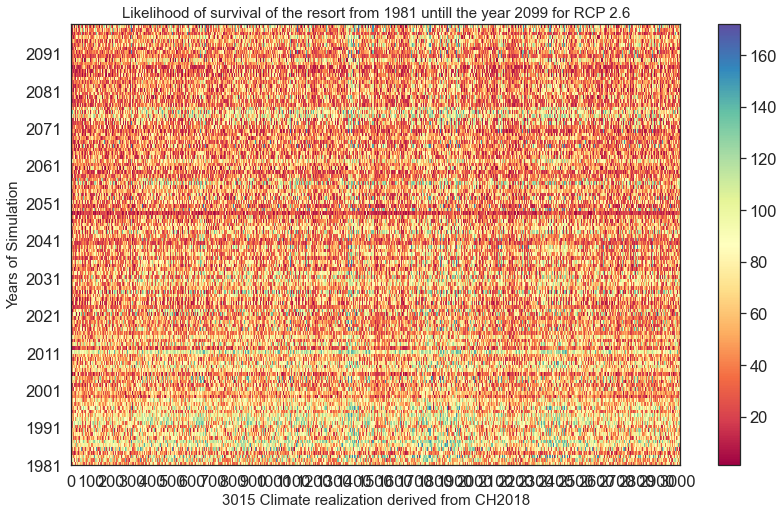

In [124]:
fig25, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig25.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6), fontsize=15)

fig25.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

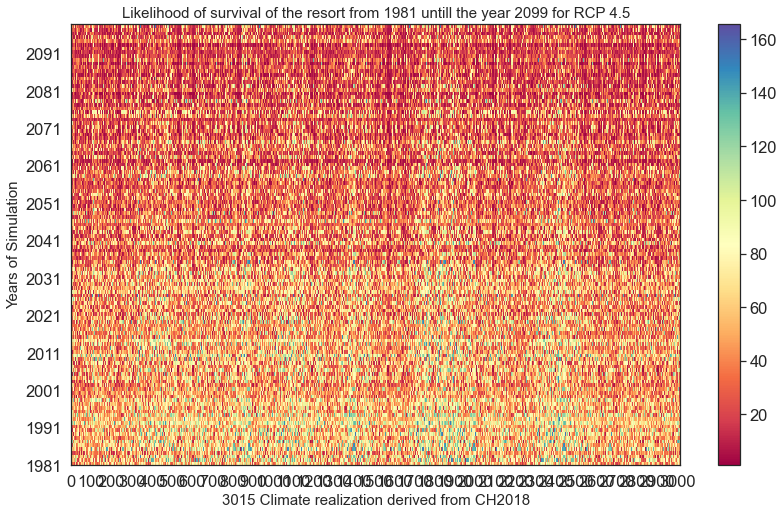

In [125]:
fig26, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig26.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5), fontsize=15)

fig26.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

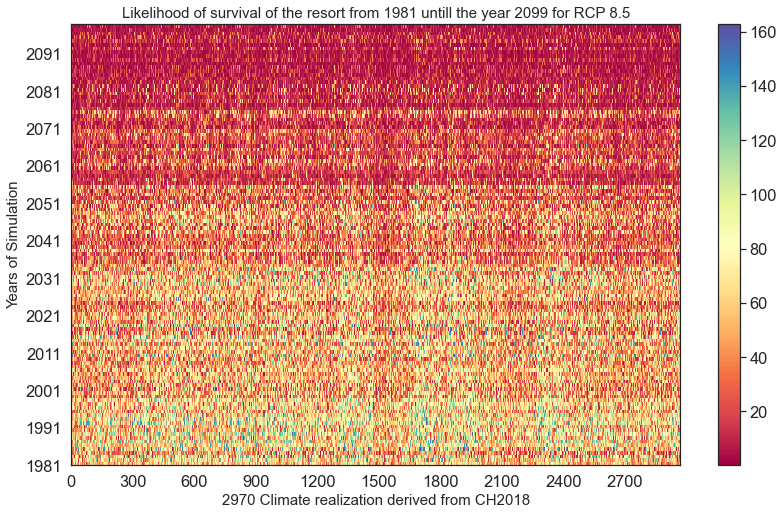

In [126]:
fig27, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')

cb3 = fig27.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5), fontsize=15)

fig27.tight_layout()
plt.show()

## 3 years of not having good snow days in 10 years

### version 1: fixed threshold

In [127]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

### version 2: dynamic threshold

In [128]:
def tipping_points_freq2(df2, threshold):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df2Columns= df2.columns
    
    scenarios_length= len(df2Columns)
    simulations_Length = len(df2[df2Columns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df2[df2Columns[i]].iloc[j]) < threshold[i-1] -10:
                m += 1
                mm += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                mm = 0
                continue    
                #break
    return tipping_freq

### version 3: Time rolling and policy selection added

In [129]:
def tipping_points_freq3(df3, threshold, beginningYear, endYear, policy, tippingpoint_threshold, scenario):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df3Columns= df3.columns
    
    scenarios_length= len(df3Columns)
    #simulations_Length = len(df3[df3Columns[1]])
    simulations_Length = endYear - beginningYear + 1
    statring_year = beginningYear - 1981 
    tipping_freq = np.zeros(scenarios_length)
    goodPolicy = []
    goodScenario = []
    goodTippingPoint = []
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 + statring_year, statring_year + simulations_Length + 1, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            mm += 1
            if float(df3[df3Columns[i]].iloc[j]) < threshold[i-1]:
                m += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                if mm > 10:
                    m = 0
                    mm = 0
                #continue    
                #break
                
        if tipping_freq[i] < tippingpoint_threshold:
            goodPolicy.append(policy[i-1])
            goodScenario.append(scenario[i-1])
            goodTippingPoint.append(tipping_freq[i])
        else:
            continue
            
    return tipping_freq, goodTippingPoint, goodPolicy, goodScenario

In [130]:
df26_all.shape

(118, 3016)

In [131]:
filt_S26 = (df_final_ema['xRCP'] == 1)
thresholds_26 = df_final_ema.loc[filt_S26, 'xGoodDays']
thresholds_26_m = thresholds_26.to_numpy()
thresholds_26_pol = df_final_ema.loc[filt_S26, 'policy']
thresholds_26_pol_m = thresholds_26_pol.to_numpy()
thresholds_26_sce = df_final_ema.loc[filt_S26, 'scenario']
thresholds_26_sce_m = thresholds_26_sce.to_numpy()

filt_S45 = (df_final_ema['xRCP'] == 2)
thresholds_45 = df_final_ema.loc[filt_S45, 'xGoodDays']
thresholds_45_m = thresholds_45.to_numpy()
thresholds_45_pol = df_final_ema.loc[filt_S45, 'policy']
thresholds_45_pol_m = thresholds_45_pol.to_numpy()
thresholds_45_sce = df_final_ema.loc[filt_S45, 'scenario']
thresholds_45_sce_m = thresholds_45_sce.to_numpy()

filt_S85 = (df_final_ema['xRCP'] == 3)
thresholds_85 = df_final_ema.loc[filt_S85, 'xGoodDays']
thresholds_85_m = thresholds_85.to_numpy()
thresholds_85_pol = df_final_ema.loc[filt_S85, 'policy']
thresholds_85_pol_m = thresholds_85_pol.to_numpy()
thresholds_85_sce = df_final_ema.loc[filt_S85, 'scenario']
thresholds_85_sce_m = thresholds_85_sce.to_numpy()


In [132]:
type(df26_all)

pandas.core.frame.DataFrame

In [133]:
thresholds_85_sce_m

array([  3,   6,   7, ..., 178, 180, 184], dtype=int64)

In [134]:
thresholds_45_sce_m

array([  8,  12,  13, ..., 196, 198, 199], dtype=int64)

In [135]:
df26_allColumns = df26_all.columns

In [136]:
df26_all[df26_allColumns[1]].iloc[0]

'77.39185714285709'

In [137]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_26_7'],sc_2_['isOverSnow_sc_26_5'],sc_3_['isOverSnow_sc_26_2'],sc_4_['isOverSnow_sc_26_7'],sc_5_['isOverSnow_sc_26_5'],sc_6_['isOverSnow_sc_26_10'],sc_7_['isOverSnow_sc_26_3'],sc_8_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_9_['isOverSnow_sc_26_3'],sc_10_['isOverSnow_sc_26_2'],sc_11_['isOverSnow_sc_26_7'],sc_12_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_13_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_14_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_15_['isOverSnow_sc_26_8'],sc_16_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_17_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_18_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_19_['isOverSnow_sc_26_2'],sc_20_['isOverSnow_sc_26_6'],sc_21_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_22_['isOverSnow_sc_26_1'],sc_23_['isOverSnow_sc_26_7'],sc_24_['isOverSnow_sc_26_10'],sc_25_['isOverSnow_sc_26_2'],sc_26_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_27_['isOverSnow_sc_26_10'],sc_28_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_29_['isOverSnow_sc_26_7'],sc_30_['isOverSnow_sc_26_11'],sc_31_['isOverSnow_sc_26_8'],sc_32_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_33_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],...,sc_2982_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2983_['isOverSnow_sc_26_12'],sc_2984_['isOverSnow_sc_26_4'],sc_2985_['isOverSnow_sc_26_3'],sc_2986_['isOverSnow_sc_26_6'],sc_2987_['isOverSnow_sc_26_7'],sc_2988_['isOverSnow_sc_26_11'],sc_2989_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2990_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2991_['isOverSnow_sc_26_6'],sc_2992_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2993_['isOverSnow_sc_26_8'],sc_2994_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2995_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2996_['isOverSnow_sc_26_2'],sc_2997_['isOverSnow_sc_26_1'],sc_2998_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2999_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_3000_['isOverSnow_sc_26_7'],sc_3001_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3002_['isOverSnow_sc_26_4'],sc_3003_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3004_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_3005_['isOverSnow_sc_26_4'],sc_3006_['isOverSnow_sc_26_10'],sc_3007_['isOverSnow_sc_26_10'],sc_3008_['isOverSnow_sc_26_6'],sc_3009_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_3010_['isOverSnow_sc_26_2'],sc_3011_['isOverSnow_sc_26_9'],sc_3012_['isOverSnow_sc_26_10'],sc_3013_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_3014_['isOverSnow_sc_26_12'],sc_3015_['isOverSnow_sc_26_4']
0,1981-1982,77.39185714285709,46.79014285714293,91.3376071428571,72.23239999999996,43.67079999999993,21.13216666666667,28.065700000000025,46.33220000000006,26.622133333333345,85.24843333333338,70.49039999999998,23.050966666666653,49.97806666666664,77.9750000000001,47.36090000000004,53.579800000000006,16.832633333333327,20.345199999999995,78.12396666666655,41.455785714285724,20.84809999999999,33.258933333333324,59.305833333333354,22.448433333333327,76.32666666666657,50.056066666666716,23.235066666666672,49.714766666666634,74.77980000000001,28.901133333333327,58.71063333333335,44.49683333333334,43.016566666666705,...,63.853758620689725,30.201344827586233,40.1343448275862,28.523714285714263,44.64469230769231,78.73564285714285,38.74796153846151,53.448461538461515,57.51142307692308,63.17688461538462,83.79426923076916,50.80273076923072,51.0119230769231,73.39049999999997,88.94346153846165,34.629846153846174,43.41038461538461,62.428846153846195,85.62661538461532,30.80719230769229,31.563000000000027,50.43926923076922,27.531423076923044,32.312961538461536,24.365923076923085,30.521153846153847,58.54311538461542,43.87865384615383,97.84449999999993,110.83188461538464,21.935928571428576,71.22150000000002,33.686115384615356,44.76523076923077
1,1982-1983,48.02342857142852,29.780678571428574,37.34692857142855,44.82186666666666,27.7

In [138]:
thresholds_45_sce_m.shape

(3015,)

In [139]:
#print(thresholds_85.shape)
print(type(thresholds_85_m))
print(thresholds_85_m[1])
print(thresholds_85_pol_m[20])
print(thresholds_85_sce_m[20])

<class 'numpy.ndarray'>
100.0
0
60


In [140]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [141]:
T1RCP26_m = tipping_points_freq2(df26_all, thresholds_26_m)
T1RCP45_m = tipping_points_freq2(df45_all, thresholds_45_m)
T1RCP85_m = tipping_points_freq2(df85_all, thresholds_85_m)

In [142]:
T1RCP26_m_3 , tipping26_3, scenario26_3, policy26_3= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2097, thresholds_26_pol_m, 10, thresholds_26_sce_m)
T1RCP45_m_3 , tipping45_3, scenario45_3, policy45_3= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2097, thresholds_45_pol_m, 10, thresholds_45_sce_m)
T1RCP85_m_3 , tipping85_3, scenario85_3, policy85_3= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2097, thresholds_85_pol_m, 10, thresholds_85_sce_m)

In [143]:
print(len( policy26_3))
print(len( policy45_3))
print(len( policy85_3))

44
0
0


In [144]:
print(len(scenario26_3))
print(len(scenario45_3))
print(len(scenario85_3))

44
0
0


In [145]:
print(len(tipping26_3))
print(len(tipping45_3))
print(len(tipping85_3))

44
0
0


In [146]:
print(len(T1RCP26_m_3))
print(len(T1RCP45_m_3))
print(len(T1RCP85_m_3))

3016
3016
2971


In [147]:
print(len(T1RCP26[1:]))
print(len(T1RCP45[1:]))
print(len(T1RCP85[1:]))

3015
3015
2970


In [148]:
type(T1RCP85)

numpy.ndarray

In [149]:
T1RCP85.shape

(2971,)

In [150]:
print(type(T1RCP85_m_3))
print(type(scenario85_3))
print(type(policy85_3))

<class 'numpy.ndarray'>
<class 'list'>
<class 'list'>


In [151]:
tipping26_3_df = pd.DataFrame(tipping26_3, columns =['tippingPoint26'])
tipping45_3_df = pd.DataFrame(tipping45_3, columns =['tippingPoint45'])
tipping85_3_df = pd.DataFrame(tipping85_3, columns =['tippingPoint85'])

scenario26_m_3 = pd.DataFrame(scenario26_3, columns =['Scenario26'])
scenario45_m_3 = pd.DataFrame(scenario45_3, columns =['Scenario45'])
scenario85_m_3 = pd.DataFrame(scenario85_3, columns =['Scenario85'])

policy26_m_3 = pd.DataFrame(policy26_3, columns =['Policy26'])
policy45_m_3 = pd.DataFrame(policy45_3, columns =['Policy45'])
policy85_m_3 = pd.DataFrame(policy85_3, columns =['Policy85'])

In [152]:
df_final_tipping_point = pd.concat((tipping26_3_df, scenario26_m_3, policy26_m_3, 
                                    tipping45_3_df, scenario45_m_3, policy45_m_3,
                                    tipping85_3_df, scenario85_m_3, policy85_m_3), axis = 1)

df_final_tipping_point.head(38)

,tippingPoint26,Scenario26,Policy26,tippingPoint45,Scenario45,Policy45,tippingPoint85,Scenario85,Policy85
0,8.0,3,70,NaN,NaN,NaN,NaN,NaN,NaN
1,8.0,3,197,NaN,NaN,NaN,NaN,NaN,NaN
2,5.0,5,10,NaN,NaN,NaN,NaN,NaN,NaN
3,5.0,5,114,NaN,NaN,NaN,NaN,NaN,NaN
4,5.0,5,185,NaN,NaN,NaN,NaN,NaN,NaN
5,5.0,9,1,NaN,NaN,NaN,NaN,NaN,NaN
6,6.0,9,70,NaN,NaN,NaN,NaN,NaN,NaN
7,7.0,9,103,NaN,NaN,NaN,NaN,NaN,NaN
8,5.0,9,116,NaN,NaN,NaN,NaN,NaN,NaN
9,3.0,12,56,NaN,NaN,NaN,NaN,NaN,NaN


### Specify the number of runs
for instance : number_Simulations = 9000

In [153]:
number_Simulations = 9000
x_axis = np.arange(1,number_Simulations + 2)

In [154]:
print("The lengthe of Y is: {}".format(len(T1RCP26[1:])))
print("The lengthe of X is: {}".format(len(matrix_GoodDays26) + 1 -1))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP45[1:])))
print("The lengthe of X is: {}".format((len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1) -(len(matrix_GoodDays26) + 1)))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP85[1:])))
print("The lengthe of X is: {}".format(number_Simulations+1 - (len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1)))

The lengthe of Y is: 3015
The lengthe of X is: 3015
***
The lengthe of Y is: 3015
The lengthe of X is: 3015
***
The lengthe of Y is: 2970
The lengthe of X is: 2970


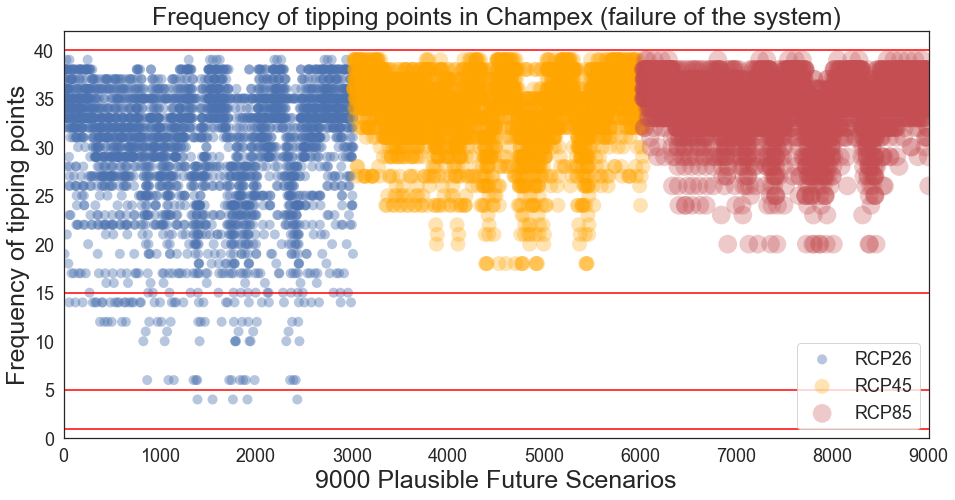

In [155]:
fig28, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)
fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.tiff'), format='tiff', dpi=150)

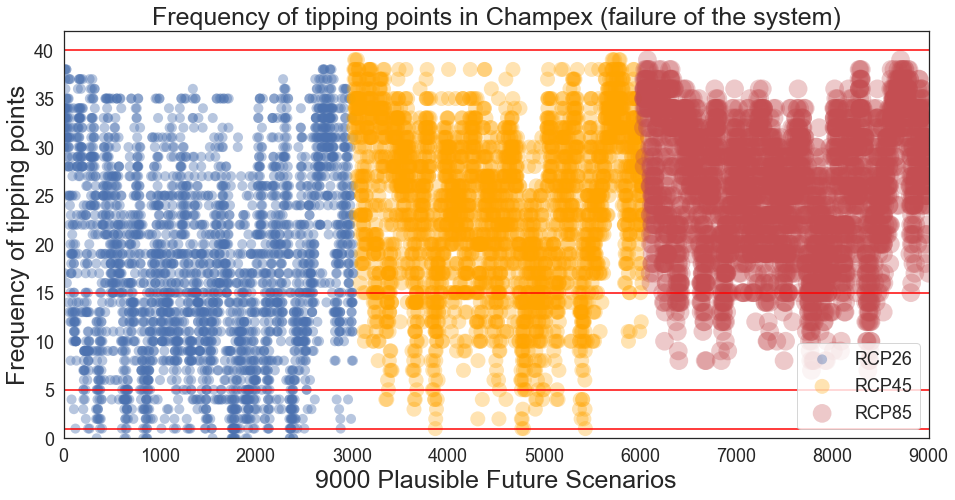

In [156]:
fig29, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.svg'), format='svg', dpi=1200)
fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.tiff'), format='tiff', dpi=150)

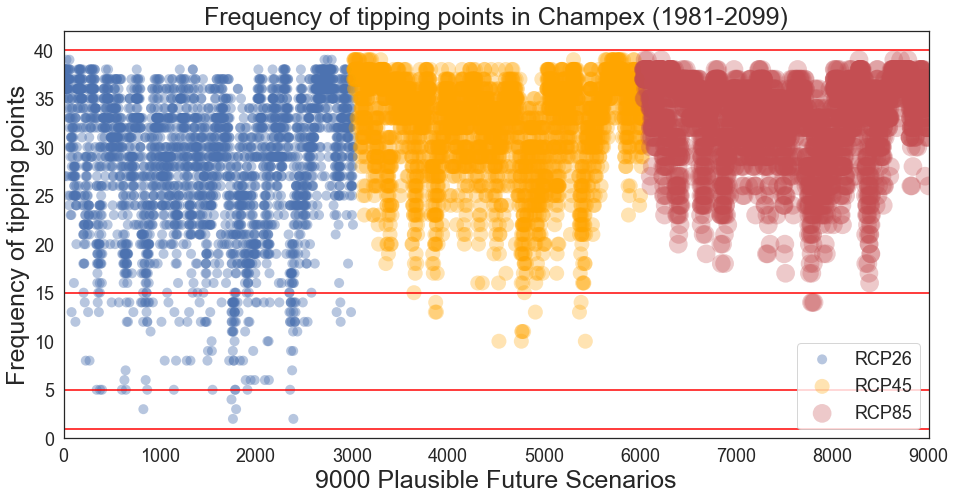

In [157]:
fig30, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.svg'), format='svg', dpi=1200)
fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.tiff'), format='tiff', dpi=150)

### Check the 45 policies

In [158]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.207303,997.452394,5.797032,-1.987439,1.943691,0.39752,1.0,280.0,100.0,1,0,UZHModel,56.221079,4,46.790143,29.780679,147.864464,68.187857,61.555393,52.139679,28.287107,56.865357,87.690500,76.095179,80.042857,27.737643,37.249964,67.556429,63.251214,38.627750,39.938500,111.806036,42.502893,40.399071,...,22.933250,31.382786,26.245964,72.123857,44.495429,107.489750,81.989714,29.677000,17.204750,44.223393,2.727143,80.707643,26.153000,16.583143,20.344429,57.544250,113.396893,37.103964,33.044857,23.032286,68.543250,32.620607,84.798036,69.220607,80.544393,62.300536,4.385786,86.004964,60.462679,70.526286,62.469068,2.126864,0.465437,32.0
201,1.207303,997.452394,5.797032,-1.987439,1.943691,0.39752,1.0,250.0,70.0,1,1,UZHModel,62.239577,4,52.404960,33.354360,154.615520,76.370400,68.942040,58.396440,31.681560,63.689200,97.436840,85.226600,89.648000,31.066160,41.719960,75.663200,70.841360,43.263080,44.731120,117.904840,47.603240,45.246960,...,25.685240,35.148720,29.395480,80.778720,49.834880,113.878840,91.828480,33.238240,19.269320,49.530200,3.054400,90.392560,29.291360,18.573120,22.785760,64.449560,118.594080,41.556440,37.010240,25.796160,76.768440,36.535080,94.973800,76.450480,87.931520,69.776600,4.912080,95.954360,67.718200,78.989440,62.469068,2.593559,0.641852,13.0
401,1.207303,997.452394,5.797032,-1.987439,1.943691,0.39752,1.0,200.0,100.0,1,2,UZHModel,74.471759,4,65.506200,41.692950,167.429000,90.328850,86.105650,72.995550,39.601950,79.611500,113.093000,106.533250,110.559050,38.832700,52.149950,92.509950,88.551700,54.078850,55.913900,127.264000,59.504050,56.558700,...,32.106550,43.935900,36.744350,100.889000,62.293600,123.276600,114.785600,41.547800,24.086650,61.912750,3.818000,108.374400,36.614200,23.216400,28.482200,80.561950,127.948000,51.945550,46.262800,32.245200,94.267300,45.668850,117.637100,84.252800,99.628750,87.220750,6.140100,115.337600,84.647750,98.622250,62.469068,3.883051,0.592059,21.0
601,1.207303,997.452394,5.797032,-1.987439,1.943691,0.39752,1.0,260.0,60.0,1,3,UZHModel,60.137714,4,50.389385,32.071500,152.576385,73.433077,66.290423,56.150423,30.463038,61.239615,94.043654,81.948654,86.200000,29.871308,40.115346,72.753077,68.116692,41.599115,43.010692,116.212385,45.772346,43.506692,...,24.697346,33.796846,28.264885,77.671846,47.918154,111.877692,88.296615,31.959846,18.528192,47.625192,2.936923,86.915923,28.164769,17.858769,21.909385,61.970731,116.985308,39.958115,35.586769,24.804000,73.815808,35.129885,91.320962,74.227962,85.418769,67.092885,4.723154,92.459192,65.113654,75.951385,62.469068,2.424831,0.674424,8.0
801,1.207303,997.452394,5.797032,-1.987439,1.943691,0.39752,1.0,260.0,100.0,1,4,UZHModel,60.137714,4,50.389385,32.071500,152.576385,73.433077,66.290423,56.150423,30.463038,61.239615,94.043654,81.948654,86.200000,29.871308,40.115346,72.753077,68.116692,41.599115,43.010692,116.212385,45.772346,43.506692,...,24.697346,33.796846,28.264885,77.671846,47.918154,111.877692,88.296615,31.959846,18.528192,47.625192,2.936923,86.915923,28.164769,17.858769,21.909385,61.970731,116.985308,39.958115,35.586769,24.804000,73.815808,35.129885,91.320962,74.227962,85.418769,67.092885,4.723154,92.459192,65.113654,75.951385,62.469068,2.424831,0.494184,30.0
1001,1.207303,997.452394,5.797032,-1.987439,1.943691,0.39752,1.0,300.0,60.0,1,5,UZHModel,52.645276,4,43.670800,27.795300,142.828533,63.642000,57.451700,48.663700,26.401300,53.074333,81.860167,71

In [216]:
df_final_ema[filt_S].to_csv(os.path.join(rootVisualization, 'df_policies.csv'), index = False)

In [159]:
T1RCP26_m_3_1980 , tipping26_3_1980, scenario26_3_1980, policy26_3_1980= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2010, thresholds_26_pol_m, 30, thresholds_26_sce_m)
T1RCP45_m_3_1980 , tipping45_3_1980, scenario45_3_1980, policy45_3_1980= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2010, thresholds_45_pol_m, 30, thresholds_45_sce_m)
T1RCP85_m_3_1980 , tipping85_3_1980, scenario85_3_1980, policy85_3_1980= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2010, thresholds_85_pol_m, 30, thresholds_85_sce_m)

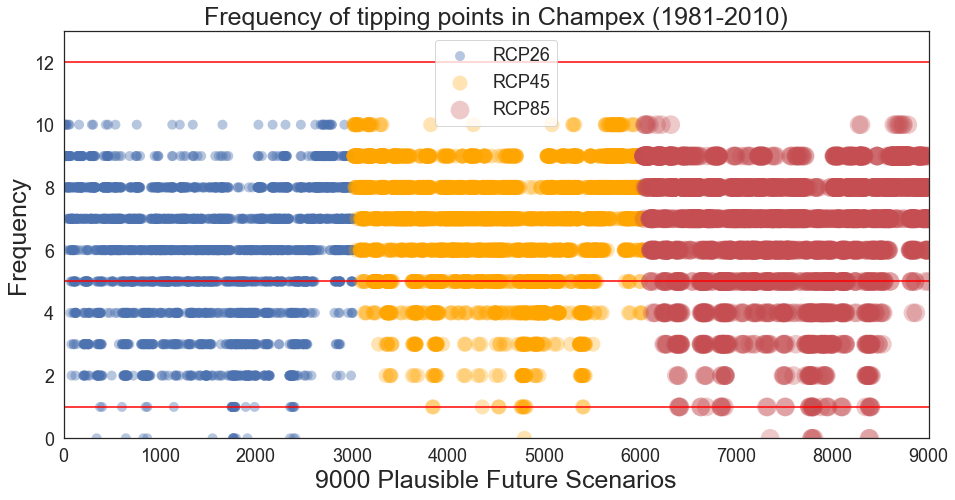

In [160]:
fig31, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_1980[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_1980[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_1980[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2010)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.svg'), format='svg', dpi=600)
fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.tiff'), format='tiff', dpi=150)

In [161]:
type(T1RCP85_m_3_1980)

numpy.ndarray

In [162]:
T1RCP26_m_3_1980_df = pd.DataFrame(T1RCP26_m_3_1980, columns =['tippingPoint26_1980'])
tipping26_3_1980_df = pd.DataFrame(tipping26_3_1980, columns =['tippingPoint26_1_1980'])
scenario26_3_1980_df = pd.DataFrame(scenario26_3_1980, columns =['scenario26_1980'])
policy26_3_1980_df = pd.DataFrame(policy26_3_1980, columns =['policy26_1980'])

T1RCP45_m_3_1980_df = pd.DataFrame(T1RCP45_m_3_1980, columns =['tippingPoint45_1980'])
tipping45_3_1980_df = pd.DataFrame(tipping45_3_1980, columns =['tippingPoint45_1_1980'])
scenario45_3_1980_df = pd.DataFrame(scenario45_3_1980, columns =['scenario45_1980'])
policy45_3_1980_df = pd.DataFrame(policy45_3_1980, columns =['policy45_1980'])

T1RCP85_m_3_1980_df = pd.DataFrame(T1RCP85_m_3_1980, columns =['tippingPoint85_1980'])
tipping85_3_1980_df = pd.DataFrame(tipping85_3_1980, columns =['tippingPoint85_1_1980'])
scenario85_3_1980_df = pd.DataFrame(scenario85_3_1980, columns =['scenario85_1980'])
policy85_3_1980_df = pd.DataFrame(policy85_3_1980, columns =['policy85_1980'])

In [217]:
df_final_tipping_point_1980 = pd.concat((T1RCP26_m_3_1980_df, tipping26_3_1980_df, scenario26_3_1980_df, policy26_3_1980_df,
                                         T1RCP45_m_3_1980_df, tipping45_3_1980_df, scenario45_3_1980_df, policy45_3_1980_df,
                                         T1RCP85_m_3_1980_df, tipping85_3_1980_df, scenario85_3_1980_df, policy85_3_1980_df), axis = 1)
df_final_tipping_point_1980.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_1980.csv'), index = False)

In [164]:
print(T1RCP26_m_3_1980_df['tippingPoint26_1980'].value_counts())
print(T1RCP45_m_3_1980_df['tippingPoint45_1980'].value_counts())
print(T1RCP85_m_3_1980_df['tippingPoint85_1980'].value_counts())

8.0     578
7.0     522
6.0     488
5.0     390
4.0     266
9.0     238
3.0     228
2.0     227
10.0     37
1.0      26
0.0      16
Name: tippingPoint26_1980, dtype: int64
7.0     666
8.0     592
9.0     518
6.0     459
5.0     322
4.0     221
3.0     103
10.0     67
2.0      52
1.0      14
0.0       2
Name: tippingPoint45_1980, dtype: int64
8.0     680
7.0     644
9.0     485
6.0     453
5.0     258
4.0     188
3.0     149
2.0      50
1.0      38
10.0     18
0.0       8
Name: tippingPoint85_1980, dtype: int64


In [165]:
print(tipping26_3_1980_df['tippingPoint26_1_1980'].value_counts())
print(tipping45_3_1980_df['tippingPoint45_1_1980'].value_counts())
print(tipping85_3_1980_df['tippingPoint85_1_1980'].value_counts())

8.0     578
7.0     522
6.0     488
5.0     390
4.0     266
9.0     238
3.0     228
2.0     227
10.0     37
1.0      26
0.0      15
Name: tippingPoint26_1_1980, dtype: int64
7.0     666
8.0     592
9.0     518
6.0     459
5.0     322
4.0     221
3.0     103
10.0     67
2.0      52
1.0      14
0.0       1
Name: tippingPoint45_1_1980, dtype: int64
8.0     680
7.0     644
9.0     485
6.0     453
5.0     258
4.0     188
3.0     149
2.0      50
1.0      38
10.0     18
0.0       7
Name: tippingPoint85_1_1980, dtype: int64


In [166]:
print(scenario26_3_1980_df['scenario26_1980'].value_counts())
print(scenario45_3_1980_df['scenario45_1980'].value_counts())
print(scenario85_3_1980_df['scenario85_1980'].value_counts())

43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
16    67
14    67
12    67
10    67
8     67
6     67
4     67
2     67
40    67
44    67
41    67
1     67
39    67
37    67
35    67
33    67
31    67
29    67
27    67
25    67
23    67
21    67
19    67
17    67
15    67
13    67
11    67
9     67
7     67
5     67
3     67
0     67
Name: scenario26_1980, dtype: int64
43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
16    67
14    67
12    67
10    67
8     67
6     67
4     67
2     67
40    67
44    67
41    67
1     67
39    67
37    67
35    67
33    67
31    67
29    67
27    67
25    67
23    67
21    67
19    67
17    67
15    67
13    67
11    67
9     67
7     67
5     67
3     67
0     67
Name: scenario45_1980, dtype: int64
43    66
42    66
38    66
36    66
34    66
32    66
30    66
28    66
26    66
24    66
22    66
20    66
18    66
1

In [167]:
print(policy26_3_1980_df['policy26_1980'].value_counts())
print(policy45_3_1980_df['policy45_1980'].value_counts())
print(policy85_3_1980_df['policy85_1980'].value_counts())

197    45
56     45
148    45
140    45
138    45
130    45
128    45
116    45
114    45
112    45
82     45
80     45
78     45
76     45
70     45
64     45
54     45
156    45
44     45
42     45
38     45
36     45
34     45
32     45
28     45
24     45
22     45
18     45
16     45
10     45
4      45
2      45
150    45
166    45
193    45
87     45
185    45
179    45
175    45
173    45
153    45
149    45
147    45
139    45
133    45
123    45
117    45
103    45
99     45
91     45
85     45
168    45
83     45
79     45
77     45
65     45
61     45
25     45
21     45
19     45
11     45
9      45
5      45
1      45
194    45
186    45
0      45
Name: policy26_1980, dtype: int64
199    45
92     45
172    45
170    45
164    45
162    45
160    45
146    45
144    45
142    45
120    45
118    45
110    45
108    45
106    45
94     45
88     45
188    45
74     45
72     45
68     45
66     45
62     45
58     45
52     45
48     45
40     45
30     45
26     45
20    

In [221]:
T1RCP26_m_3_2020 , tipping26_3_2020, scenario26_3_2020, policy26_3_2020= tipping_points_freq3(df26_all, thresholds_26_m, 2020, 2049, thresholds_26_pol_m, 9, thresholds_26_sce_m)
T1RCP45_m_3_2020 , tipping45_3_2020, scenario45_3_2020, policy45_3_2020= tipping_points_freq3(df45_all, thresholds_45_m, 2020, 2049, thresholds_45_pol_m, 9, thresholds_45_sce_m)
T1RCP85_m_3_2020 , tipping85_3_2020, scenario85_3_2020, policy85_3_2020= tipping_points_freq3(df85_all, thresholds_85_m, 2020, 2049, thresholds_85_pol_m, 9, thresholds_85_sce_m)

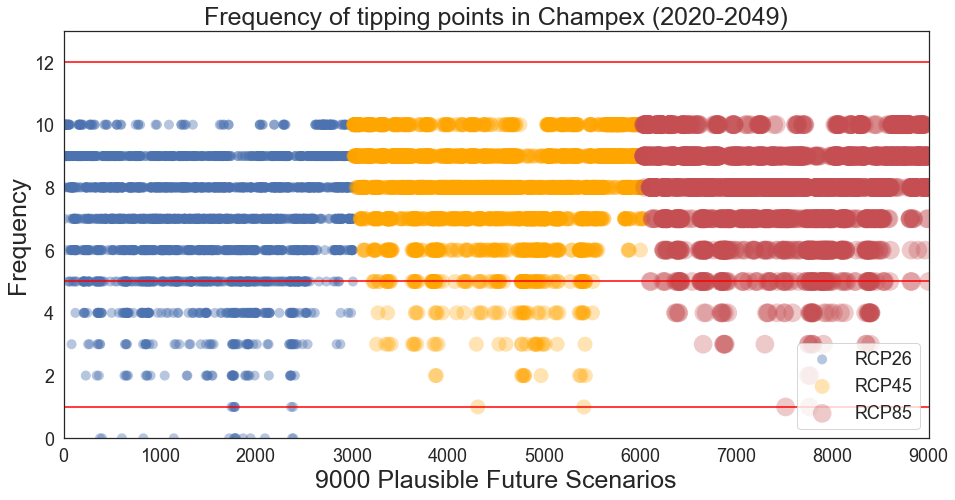

In [222]:
fig32, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2020[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2020[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2020[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2020-2049)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.svg'), format='svg', dpi=600)
fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.tiff'), format='tiff', dpi=150)

In [223]:
T1RCP26_m_3_2020_df = pd.DataFrame(T1RCP26_m_3_2020, columns =['tippingPoint26_2020'])
tipping26_3_2020_df = pd.DataFrame(tipping26_3_2020, columns =['tippingPoint26_1_2020'])
scenario26_3_2020_df = pd.DataFrame(scenario26_3_2020, columns =['scenario26_2020'])
policy26_3_2020_df = pd.DataFrame(policy26_3_2020, columns =['policy26_2020'])

T1RCP45_m_3_2020_df = pd.DataFrame(T1RCP45_m_3_2020, columns =['tippingPoint45_2020'])
tipping45_3_2020_df = pd.DataFrame(tipping45_3_2020, columns =['tippingPoint45_1_2020'])
scenario45_3_2020_df = pd.DataFrame(scenario45_3_2020, columns =['scenario45_2020'])
policy45_3_2020_df = pd.DataFrame(policy45_3_2020, columns =['policy45_2020'])

T1RCP85_m_3_2020_df = pd.DataFrame(T1RCP85_m_3_2020, columns =['tippingPoint85_2020'])
tipping85_3_2020_df = pd.DataFrame(tipping85_3_2020, columns =['tippingPoint85_1_2020'])
scenario85_3_2020_df = pd.DataFrame(scenario85_3_2020, columns =['scenario85_2020'])
policy85_3_2020_df = pd.DataFrame(policy85_3_2020, columns =['policy85_2020'])

In [224]:
df_final_tipping_point_2020 = pd.concat((T1RCP26_m_3_2020_df, tipping26_3_2020_df, scenario26_3_2020_df, policy26_3_2020_df,
                                         T1RCP45_m_3_2020_df, tipping45_3_2020_df, scenario45_3_2020_df, policy45_3_2020_df,
                                         T1RCP85_m_3_2020_df, tipping85_3_2020_df, scenario85_3_2020_df, policy85_3_2020_df), axis = 1)
df_final_tipping_point_2020.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2020.csv'), index = False)

In [225]:
print(T1RCP26_m_3_2020_df['tippingPoint26_2020'].value_counts())
print(T1RCP45_m_3_2020_df['tippingPoint45_2020'].value_counts())
print(T1RCP85_m_3_2020_df['tippingPoint85_2020'].value_counts())

9.0     761
8.0     629
7.0     497
6.0     431
5.0     272
4.0     157
10.0    137
3.0      67
2.0      42
0.0      16
1.0       7
Name: tippingPoint26_2020, dtype: int64
9.0     968
8.0     798
7.0     442
10.0    371
6.0     243
5.0     114
4.0      39
3.0      27
2.0      11
1.0       2
0.0       1
Name: tippingPoint45_2020, dtype: int64
9.0     1031
8.0      776
7.0      395
10.0     327
6.0      246
5.0      130
4.0       46
3.0       15
2.0        2
1.0        2
0.0        1
Name: tippingPoint85_2020, dtype: int64


In [226]:
print(tipping26_3_2020_df['tippingPoint26_1_2020'].value_counts())
print(tipping45_3_2020_df['tippingPoint45_1_2020'].value_counts())
print(tipping85_3_2020_df['tippingPoint85_1_2020'].value_counts())

8.0    629
7.0    497
6.0    431
5.0    272
4.0    157
3.0     67
2.0     42
0.0     15
1.0      7
Name: tippingPoint26_1_2020, dtype: int64
8.0    798
7.0    442
6.0    243
5.0    114
4.0     39
3.0     27
2.0     11
1.0      2
Name: tippingPoint45_1_2020, dtype: int64
8.0    776
7.0    395
6.0    246
5.0    130
4.0     46
3.0     15
2.0      2
1.0      2
Name: tippingPoint85_1_2020, dtype: int64


In [227]:
print(scenario26_3_2020_df['scenario26_2020'].value_counts())
print(scenario45_3_2020_df['scenario45_2020'].value_counts())
print(scenario85_3_2020_df['scenario85_2020'].value_counts())

26    67
35    64
9     64
12    64
27    63
5     63
17    62
28    62
31    62
29    61
22    60
13    59
37    59
21    59
3     58
10    57
42    57
19    57
15    57
1     57
25    54
33    54
38    51
44    51
23    51
36    51
20    50
16    49
32    46
14    45
7     45
8     43
24    43
18    37
30    35
11    35
6     31
43    31
34    27
39    21
4     18
2     10
0     10
41     9
40     8
Name: scenario26_2020, dtype: int64
35    67
26    65
28    65
12    64
27    63
5     62
9     62
29    62
19    61
31    60
17    59
13    59
22    59
3     59
37    58
15    55
21    52
25    48
1     47
42    47
10    45
33    43
36    39
16    38
44    36
23    36
20    35
38    30
14    24
8     23
24    23
32    22
7     21
18    16
30    13
11    12
34     9
6      8
43     8
39     4
4      4
0      4
40     3
2      3
41     3
Name: scenario45_2020, dtype: int64
12    66
26    66
28    66
5     66
9     66
31    66
35    66
29    63
19    61
3     61
17    60
22    59
13    58
2

In [228]:
print(policy26_3_2020_df['policy26_2020'].value_counts())
print(policy45_3_2020_df['policy45_2020'].value_counts())
print(policy85_3_2020_df['policy85_2020'].value_counts())

173    37
61     37
186    36
133    36
123    36
166    35
65     35
22     35
148    35
38     34
168    34
194    34
1      34
197    34
128    33
147    33
87     33
10     33
16     33
34     33
44     33
25     33
76     33
175    33
9      33
149    33
2      32
36     32
70     32
193    32
99     32
19     32
5      32
11     32
103    32
116    31
153    31
42     31
179    31
32     31
64     31
21     31
185    31
79     31
4      31
156    31
24     31
28     30
139    30
140    30
114    30
78     29
77     29
18     29
130    29
91     29
112    29
82     29
54     29
117    28
83     28
150    28
56     27
138    27
85     27
80     26
0      26
Name: policy26_2020, dtype: int64
121    32
40     31
187    30
142    30
160    29
49     29
120    29
13     29
137    28
172    28
162    27
106    27
45     27
67     27
169    27
73     27
192    26
165    26
72     26
161    26
89     26
181    26
146    26
14     26
190    26
118    26
189    26
68     25
107    25
58    

In [229]:
T1RCP26_m_3_2050 , tipping26_3_2050, scenario26_3_2050, policy26_3_2050= tipping_points_freq3(df26_all, thresholds_26_m, 2050, 2079, thresholds_26_pol_m, 9, thresholds_26_sce_m)
T1RCP45_m_3_2050 , tipping45_3_2050, scenario45_3_2050, policy45_3_2050= tipping_points_freq3(df45_all, thresholds_45_m, 2050, 2079, thresholds_45_pol_m, 9, thresholds_45_sce_m)
T1RCP85_m_3_2050 , tipping85_3_2050, scenario85_3_2050, policy85_3_2050= tipping_points_freq3(df85_all, thresholds_85_m, 2050, 2079, thresholds_85_pol_m, 9, thresholds_85_sce_m)

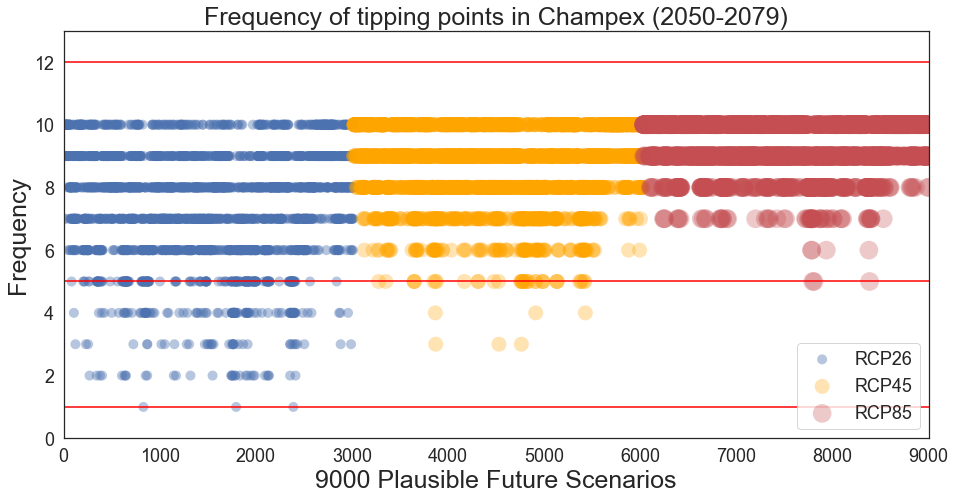

In [230]:
fig33, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2050[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2050[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2050[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2050-2079)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.svg'), format='svg', dpi=600)
fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.tiff'), format='tiff', dpi=150)

In [231]:
T1RCP26_m_3_2050_df = pd.DataFrame(T1RCP26_m_3_2050, columns =['tippingPoint26_2050'])
tipping26_3_2050_df = pd.DataFrame(tipping26_3_2050, columns =['tippingPoint26_1_2050'])
scenario26_3_2050_df = pd.DataFrame(scenario26_3_2050, columns =['scenario26_2050'])
policy26_3_2050_df = pd.DataFrame(policy26_3_2050, columns =['policy26_2050'])

T1RCP45_m_3_2050_df = pd.DataFrame(T1RCP45_m_3_2050, columns =['tippingPoint45_2050'])
tipping45_3_2050_df = pd.DataFrame(tipping45_3_2050, columns =['tippingPoint45_1_2050'])
scenario45_3_2050_df = pd.DataFrame(scenario45_3_2050, columns =['scenario45_2050'])
policy45_3_2050_df = pd.DataFrame(policy45_3_2050, columns =['policy45_2050'])

T1RCP85_m_3_2050_df = pd.DataFrame(T1RCP85_m_3_2050, columns =['tippingPoint85_2050'])
tipping85_3_2050_df = pd.DataFrame(tipping85_3_2050, columns =['tippingPoint85_1_2050'])
scenario85_3_2050_df = pd.DataFrame(scenario85_3_2050, columns =['scenario85_2050'])
policy85_3_2050_df = pd.DataFrame(policy85_3_2050, columns =['policy85_2050'])

In [232]:
df_final_tipping_point_2050 = pd.concat((T1RCP26_m_3_2050_df, tipping26_3_2050_df, scenario26_3_2050_df, policy26_3_2050_df,
                                         T1RCP45_m_3_2050_df, tipping45_3_2050_df, scenario45_3_2050_df, policy45_3_2050_df,
                                         T1RCP85_m_3_2050_df, tipping85_3_2050_df, scenario85_3_2050_df, policy85_3_2050_df), axis = 1)
df_final_tipping_point_2050.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2050.csv'), index = False)

In [233]:
print(T1RCP26_m_3_2050_df['tippingPoint26_2050'].value_counts())
print(T1RCP45_m_3_2050_df['tippingPoint45_2050'].value_counts())
print(T1RCP85_m_3_2050_df['tippingPoint85_2050'].value_counts())

9.0     699
8.0     685
7.0     503
6.0     444
10.0    313
5.0     199
4.0     101
3.0      36
2.0      32
1.0       3
0.0       1
Name: tippingPoint26_2050, dtype: int64
9.0     1174
10.0     872
8.0      543
7.0      276
6.0      108
5.0       36
3.0        3
4.0        3
0.0        1
Name: tippingPoint45_2050, dtype: int64
9.0     1324
10.0    1297
8.0      283
7.0       59
6.0        4
5.0        3
0.0        1
Name: tippingPoint85_2050, dtype: int64


In [234]:
print(tipping26_3_2050_df['tippingPoint26_1_2050'].value_counts())
print(tipping45_3_2050_df['tippingPoint45_1_2050'].value_counts())
print(tipping85_3_2050_df['tippingPoint85_1_2050'].value_counts())

8.0    685
7.0    503
6.0    444
5.0    199
4.0    101
3.0     36
2.0     32
1.0      3
Name: tippingPoint26_1_2050, dtype: int64
8.0    543
7.0    276
6.0    108
5.0     36
3.0      3
4.0      3
Name: tippingPoint45_1_2050, dtype: int64
8.0    283
7.0     59
6.0      4
5.0      3
Name: tippingPoint85_1_2050, dtype: int64


In [235]:
print(scenario26_3_2050_df['scenario26_2050'].value_counts())
print(scenario45_3_2050_df['scenario45_2050'].value_counts())
print(scenario85_3_2050_df['scenario85_2050'].value_counts())

26    66
9     65
35    65
12    64
29    64
5     63
28    63
22    61
13    60
31    60
17    60
37    58
19    58
27    58
3     58
42    55
15    55
21    55
10    53
16    53
1     53
33    52
23    52
38    48
36    48
20    46
25    46
7     44
44    40
32    40
24    38
8     36
14    35
34    31
18    29
11    27
30    27
43    25
6     22
4     16
39    14
40    11
2     11
0     10
41     8
Name: scenario26_2050, dtype: int64
26    57
35    56
12    48
28    47
9     46
5     44
29    43
22    36
31    36
19    35
3     35
13    34
27    33
17    31
37    27
21    25
15    24
10    23
1     22
33    21
23    21
42    20
25    20
36    19
38    17
16    15
44    15
20    13
24    12
32    12
8     10
14    10
7     10
11     8
34     7
6      6
18     6
30     6
43     3
39     3
2      3
41     3
0      3
4      2
40     2
Name: scenario45_2050, dtype: int64
26    44
35    33
12    28
28    26
5     23
9     23
19    16
22    15
29    15
31    14
13    12
3     12
27     9
3

In [236]:
print(policy26_3_2050_df['policy26_2050'].value_counts())
print(policy45_3_2050_df['policy45_2050'].value_counts())
print(policy85_3_2050_df['policy85_2050'].value_counts())

36     35
194    35
175    35
1      34
114    34
123    34
168    33
24     33
197    33
166    32
185    32
99     32
147    32
61     32
133    32
173    31
80     31
18     31
11     31
179    31
22     31
186    31
25     31
4      31
148    31
153    31
16     31
70     30
83     30
21     30
32     30
38     30
116    30
87     30
10     30
128    30
130    30
9      30
149    30
150    30
2      29
103    29
34     29
28     29
44     29
42     29
91     29
19     28
5      28
82     28
112    28
65     28
139    28
77     28
138    28
79     28
117    28
54     27
193    27
85     27
64     27
56     26
78     26
0      26
76     25
140    25
156    24
Name: policy26_2050, dtype: int64
129    19
68     19
142    19
127    19
196    19
169    18
14     18
108    18
198    17
73     17
74     17
20     17
160    17
49     17
106    17
165    17
23     17
137    16
155    16
13     16
94     16
182    16
183    16
58     16
101    16
120    15
40     15
52     15
195    15
189   

In [237]:
T1RCP26_m_3_2070 , tipping26_3_2070, scenario26_3_2070, policy26_3_2070= tipping_points_freq3(df26_all, thresholds_26_m, 2070, 2097, thresholds_26_pol_m, 9, thresholds_26_sce_m)
T1RCP45_m_3_2070 , tipping45_3_2070, scenario45_3_2070, policy45_3_2070= tipping_points_freq3(df45_all, thresholds_45_m, 2070, 2097, thresholds_45_pol_m, 9, thresholds_45_sce_m)
T1RCP85_m_3_2070 , tipping85_3_2070, scenario85_3_2070, policy85_3_2070= tipping_points_freq3(df85_all, thresholds_85_m, 2070, 2097, thresholds_85_pol_m, 9, thresholds_85_sce_m)

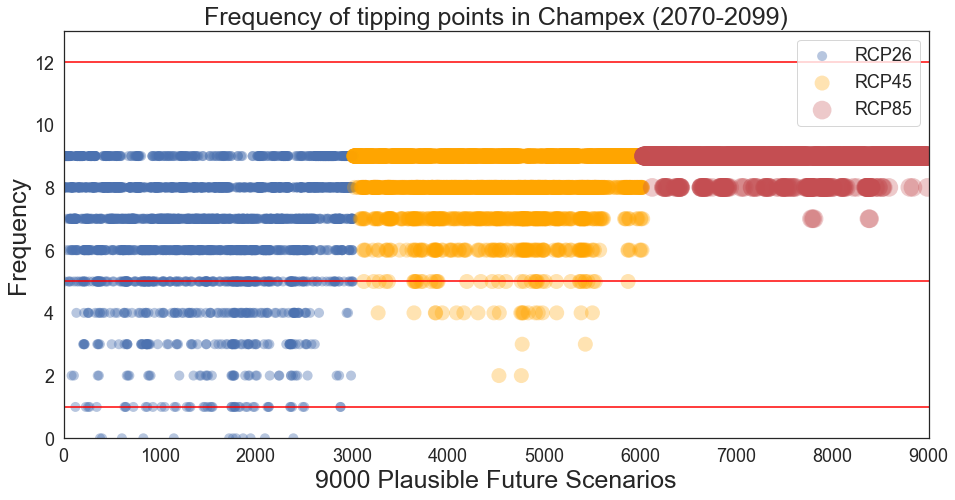

In [238]:
fig34, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2070[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2070[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2070[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2070-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.svg'), format='svg', dpi=600)
fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.tiff'), format='tiff', dpi=150)

In [239]:
T1RCP26_m_3_2070_df = pd.DataFrame(T1RCP26_m_3_2070, columns =['tippingPoint26_2070'])
tipping26_3_2070_df = pd.DataFrame(tipping26_3_2070, columns =['tippingPoint26_1_2070'])
scenario26_3_2070_df = pd.DataFrame(scenario26_3_2070, columns =['scenario26_2070'])
policy26_3_2070_df = pd.DataFrame(policy26_3_2070, columns =['policy26_2070'])

T1RCP45_m_3_2070_df = pd.DataFrame(T1RCP45_m_3_2070, columns =['tippingPoint45_2070'])
tipping45_3_2070_df = pd.DataFrame(tipping45_3_2070, columns =['tippingPoint45_1_2070'])
scenario45_3_2070_df = pd.DataFrame(scenario45_3_2070, columns =['scenario45_2070'])
policy45_3_2070_df = pd.DataFrame(policy45_3_2070, columns =['policy45_2070'])

T1RCP85_m_3_2070_df = pd.DataFrame(T1RCP85_m_3_2070, columns =['tippingPoint85_2070'])
tipping85_3_2070_df = pd.DataFrame(tipping85_3_2070, columns =['tippingPoint85_1_2070'])
scenario85_3_2070_df = pd.DataFrame(scenario85_3_2070, columns =['scenario85_2070'])
policy85_3_2070_df = pd.DataFrame(policy85_3_2070, columns =['policy85_2070'])

In [240]:
df_final_tipping_point_2070 = pd.concat((T1RCP26_m_3_2070_df, tipping26_3_2070_df, scenario26_3_2070_df, policy26_3_2070_df,
                                         T1RCP45_m_3_2070_df, tipping45_3_2070_df, scenario45_3_2070_df, policy45_3_2070_df,
                                         T1RCP85_m_3_2070_df, tipping85_3_2070_df, scenario85_3_2070_df, policy85_3_2070_df), axis = 1)
df_final_tipping_point_2070.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2070.csv'), index = False)

In [241]:
print(T1RCP26_m_3_2070_df['tippingPoint26_2070'].value_counts())
print(T1RCP45_m_3_2070_df['tippingPoint45_2070'].value_counts())
print(T1RCP85_m_3_2070_df['tippingPoint85_2070'].value_counts())

8.0    881
7.0    640
9.0    469
6.0    465
5.0    259
4.0    111
3.0     90
1.0     47
2.0     41
0.0     13
Name: tippingPoint26_2070, dtype: int64
9.0    1787
8.0     761
7.0     272
6.0     128
5.0      42
4.0      21
3.0       2
2.0       2
0.0       1
Name: tippingPoint45_2070, dtype: int64
9.0    2745
8.0     220
7.0       5
0.0       1
Name: tippingPoint85_2070, dtype: int64


In [242]:
print(tipping26_3_2070_df['tippingPoint26_1_2070'].value_counts())
print(tipping45_3_2070_df['tippingPoint45_1_2070'].value_counts())
print(tipping85_3_2070_df['tippingPoint85_1_2070'].value_counts())

8.0    881
7.0    640
6.0    465
5.0    259
4.0    111
3.0     90
1.0     47
2.0     41
0.0     12
Name: tippingPoint26_1_2070, dtype: int64
8.0    761
7.0    272
6.0    128
5.0     42
4.0     21
3.0      2
2.0      2
Name: tippingPoint45_1_2070, dtype: int64
8.0    220
7.0      5
Name: tippingPoint85_1_2070, dtype: int64


In [243]:
print(scenario26_3_2070_df['scenario26_2070'].value_counts())
print(scenario45_3_2070_df['scenario45_2070'].value_counts())
print(scenario85_3_2070_df['scenario85_2070'].value_counts())

5     67
9     67
28    67
26    67
12    66
35    66
22    65
29    65
21    65
17    64
13    64
3     64
1     63
19    63
10    63
27    63
31    63
33    63
37    63
23    63
16    62
15    62
42    62
36    61
44    61
25    61
38    60
14    59
32    59
24    59
20    59
7     59
11    57
8     56
6     55
18    55
30    53
43    48
34    43
4     35
39    32
2     26
40    25
41    23
0     23
Name: scenario26_2070, dtype: int64
35    58
26    58
12    52
28    51
29    48
9     48
5     47
31    43
19    43
22    42
3     42
27    41
17    40
13    39
37    37
21    34
10    33
25    33
15    33
1     29
42    29
33    28
36    26
23    26
20    24
44    22
38    21
16    21
14    19
24    18
7     18
32    15
8     14
18    14
11    12
30    12
43    11
6     11
34    10
4      6
39     5
41     5
2      4
40     3
0      3
Name: scenario45_2070, dtype: int64
26    28
35    25
12    19
28    19
9     16
5     13
22    11
19    11
3     10
31    10
29    10
25     7
17     6
2

In [244]:
print(policy26_3_2070_df['policy26_2070'].value_counts())
print(policy45_3_2070_df['policy45_2070'].value_counts())
print(policy85_3_2070_df['policy85_2070'].value_counts())

186    42
82     41
38     41
197    40
32     40
36     40
123    40
173    40
175    40
5      40
24     39
16     39
61     39
42     39
54     39
70     39
78     39
80     39
10     39
168    39
2      39
194    39
166    39
147    39
185    39
133    39
79     39
140    38
85     38
112    38
114    38
116    38
128    38
130    38
138    38
156    38
150    38
28     38
99     38
22     38
1      38
65     38
11     38
21     38
139    37
34     37
25     37
103    37
149    37
4      37
44     37
87     37
64     37
76     37
148    37
19     37
56     36
91     36
83     36
18     36
179    36
9      36
117    35
77     35
153    35
193    34
0      34
Name: policy26_2070, dtype: int64
20     25
127    24
155    23
108    23
106    22
189    22
199    21
137    21
142    21
135    21
14     21
196    21
49     21
45     21
172    20
74     20
129    20
170    20
73     20
161    20
160    20
40     20
146    20
52     19
23     19
101    19
118    19
8      19
169    19
195   

### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [192]:
from scipy.integrate import simps

def area_max_min_df (df, a, b, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario[a:b], dx=1)
    areamin1 = trapz(min_scenario[a:b], dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario[a:b], dx=1)
    areamin2 = simps(min_scenario[a:b], dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [193]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [194]:
max_scenario.to_numpy()

array([99.30159091, 99.64666667, 99.98854545, 98.8355    , 99.961     ,
       99.90992857, 99.96417857, 99.95836667, 99.9488    , 98.8964    ,
       99.443     , 99.99358333, 99.99188462, 99.91683333, 98.9692    ,
       99.87853333, 99.34804   , 99.98040909, 98.006875  , 99.8603    ,
       99.2363    , 99.72654545, 99.6954    , 99.74528571, 99.43768   ,
       99.95424138, 99.82195455, 99.56448   , 99.39405   , 99.86833333,
       99.80775   , 99.76162963, 99.84168182, 99.67275   , 99.7247    ,
       99.10965   , 99.97793333, 99.1435    , 99.94395833, 98.60605   ,
       99.76714286, 99.5321    , 98.43036667, 99.65065   , 99.33324   ,
       99.84284615, 99.98761538, 99.49754545, 99.98662963, 99.96140909,
       99.69003571, 99.9845    , 99.61159091, 99.16613793, 99.75584615,
       98.73025   , 99.7316    , 99.66529167, 99.68895833, 98.99734615,
       97.24933333, 99.67503448, 99.83655   , 99.948     , 99.3704    ,
       99.98011538, 99.84188   , 96.9213    , 99.71966667, 98.96

In [195]:
min_scenario.to_numpy()

array([100.96336   , 100.05964286,  10.7328    ,  10.23627273,
       100.42041379, 100.00114286, 100.13604545,  10.5759    ,
       100.15003448,  10.02068966,  10.0107    , 100.10766667,
       100.00870833, 100.13853333,  10.7803    , 100.25564   ,
        10.1645    , 100.001     ,  10.13972727, 101.61159091,
        10.31084   ,  10.07620833,  10.56227273,  10.00195455,
        10.33457692, 100.03663636,  10.68416667, 100.33554545,
        10.18910345, 100.14754167, 100.08274074,  10.0588    ,
        10.13162069,  10.31526667, 100.27395833, 101.9614    ,
        10.11604545,  10.02386364,  10.06529167,  10.65726667,
        10.4775    ,  10.36895   ,  10.078     ,  10.07213793,
        10.05361538, 100.53704545,  10.23588462,  10.46556667,
        10.13672414, 100.02418182,  10.29196552,  10.07288889,
        10.0457    ,  10.00662963,  10.08034483,  10.04707407,
       100.21268966,  10.4431    , 100.5199    ,  10.01754167,
         1.53046667, 100.08933333,  10.11244828,  10.24

In [196]:
max_scenario.shape

(118,)

## Changes in Good Days

In [197]:
max_scenario.to_numpy()

array([99.30159091, 99.64666667, 99.98854545, 98.8355    , 99.961     ,
       99.90992857, 99.96417857, 99.95836667, 99.9488    , 98.8964    ,
       99.443     , 99.99358333, 99.99188462, 99.91683333, 98.9692    ,
       99.87853333, 99.34804   , 99.98040909, 98.006875  , 99.8603    ,
       99.2363    , 99.72654545, 99.6954    , 99.74528571, 99.43768   ,
       99.95424138, 99.82195455, 99.56448   , 99.39405   , 99.86833333,
       99.80775   , 99.76162963, 99.84168182, 99.67275   , 99.7247    ,
       99.10965   , 99.97793333, 99.1435    , 99.94395833, 98.60605   ,
       99.76714286, 99.5321    , 98.43036667, 99.65065   , 99.33324   ,
       99.84284615, 99.98761538, 99.49754545, 99.98662963, 99.96140909,
       99.69003571, 99.9845    , 99.61159091, 99.16613793, 99.75584615,
       98.73025   , 99.7316    , 99.66529167, 99.68895833, 98.99734615,
       97.24933333, 99.67503448, 99.83655   , 99.948     , 99.3704    ,
       99.98011538, 99.84188   , 96.9213    , 99.71966667, 98.96

In [198]:
max_scenario.shape

(118,)

In [199]:
min_scenario.to_numpy()

array([100.96336   , 100.05964286,  10.7328    ,  10.23627273,
       100.42041379, 100.00114286, 100.13604545,  10.5759    ,
       100.15003448,  10.02068966,  10.0107    , 100.10766667,
       100.00870833, 100.13853333,  10.7803    , 100.25564   ,
        10.1645    , 100.001     ,  10.13972727, 101.61159091,
        10.31084   ,  10.07620833,  10.56227273,  10.00195455,
        10.33457692, 100.03663636,  10.68416667, 100.33554545,
        10.18910345, 100.14754167, 100.08274074,  10.0588    ,
        10.13162069,  10.31526667, 100.27395833, 101.9614    ,
        10.11604545,  10.02386364,  10.06529167,  10.65726667,
        10.4775    ,  10.36895   ,  10.078     ,  10.07213793,
        10.05361538, 100.53704545,  10.23588462,  10.46556667,
        10.13672414, 100.02418182,  10.29196552,  10.07288889,
        10.0457    ,  10.00662963,  10.08034483,  10.04707407,
       100.21268966,  10.4431    , 100.5199    ,  10.01754167,
         1.53046667, 100.08933333,  10.11244828,  10.24

In [200]:
df26_all_1 = df26_all.iloc[:, 1:]
df45_all_1 = df45_all.iloc[:, 1:]
df85_all_1 = df85_all.iloc[:, 1:]

In [201]:
print("1981-2010")
area_max_min_df(df26_all_1, 0, 30, 30)
area_max_min_df(df45_all_1, 0, 30, 30)
area_max_min_df(df85_all_1, 0, 30, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

1981-2010
Start************************************************************
Uncertainty Band1 =74.13 days
Uncertainty Band2 =74.00 days
****************************************End

Start************************************************************
Uncertainty Band1 =64.26 days
Uncertainty Band2 =64.14 days
****************************************End

Start************************************************************
Uncertainty Band1 =63.49 days
Uncertainty Band2 =63.24 days
****************************************End



In [202]:
print("2021-2050")
area_max_min_df(df26_all_1, 40, 70, 30)
area_max_min_df(df45_all_1, 40, 70, 30)
area_max_min_df(df85_all_1, 40, 70, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2021-2050
Start************************************************************
Uncertainty Band1 =61.87 days
Uncertainty Band2 =61.87 days
****************************************End

Start************************************************************
Uncertainty Band1 =55.26 days
Uncertainty Band2 =55.26 days
****************************************End

Start************************************************************
Uncertainty Band1 =56.18 days
Uncertainty Band2 =56.03 days
****************************************End



In [203]:
print("2051-2080")
area_max_min_df(df26_all_1, 70, 100, 30)
area_max_min_df(df45_all_1, 70, 100, 30)
area_max_min_df(df85_all_1, 70, 100, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2051-2080
Start************************************************************
Uncertainty Band1 =55.67 days
Uncertainty Band2 =55.42 days
****************************************End

Start************************************************************
Uncertainty Band1 =49.38 days
Uncertainty Band2 =49.37 days
****************************************End

Start************************************************************
Uncertainty Band1 =38.90 days
Uncertainty Band2 =38.77 days
****************************************End



In [204]:
print("2071-2100")
area_max_min_df(df26_all_1, 90, 119, 30)
area_max_min_df(df45_all_1, 90, 119, 30)
area_max_min_df(df85_all_1, 90, 119, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)

2071-2100
Start************************************************************
Uncertainty Band1 =55.34 days
Uncertainty Band2 =55.34 days
****************************************End

Start************************************************************
Uncertainty Band1 =43.87 days
Uncertainty Band2 =43.87 days
****************************************End

Start************************************************************
Uncertainty Band1 =13.54 days
Uncertainty Band2 =13.54 days
****************************************End



## Changes in Financial situation

In [205]:
df26_all_fin_1 = df26_all_fin.iloc[:, 1:]
df45_all_fin_1 = df45_all_fin.iloc[:, 1:]
df85_all_fin_1 = df85_all_fin.iloc[:, 1:]

In [206]:
max_scenario = df26_all_fin_1.max(axis=1)
min_scenario = df26_all_fin_1.min(axis=1)

In [207]:
print("1981-2010")
area_max_min_df(df26_all_fin_1, 0, 30, 30)
area_max_min_df(df45_all_fin_1, 0, 30, 30)
area_max_min_df(df85_all_fin_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =3.68 days
Uncertainty Band2 =3.68 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.55 days
Uncertainty Band2 =3.56 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.59 days
Uncertainty Band2 =3.59 days
****************************************End



In [208]:
print("2021-2050")
area_max_min_df(df26_all_fin_1, 40, 70, 30)
area_max_min_df(df45_all_fin_1, 40, 70, 30)
area_max_min_df(df85_all_fin_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =3.48 days
Uncertainty Band2 =3.48 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.29 days
Uncertainty Band2 =3.29 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.20 days
Uncertainty Band2 =3.20 days
****************************************End



In [209]:
print("2051-2080")
area_max_min_df(df26_all_fin_1, 70, 100, 30)
area_max_min_df(df45_all_fin_1, 70, 100, 30)
area_max_min_df(df85_all_fin_1, 70, 100, 30)


2051-2080
Start************************************************************
Uncertainty Band1 =3.29 days
Uncertainty Band2 =3.29 days
****************************************End

Start************************************************************
Uncertainty Band1 =2.98 days
Uncertainty Band2 =2.98 days
****************************************End

Start************************************************************
Uncertainty Band1 =2.54 days
Uncertainty Band2 =2.54 days
****************************************End



In [210]:
print("2071-2100")
area_max_min_df(df26_all_fin_1, 90, 119, 30)
area_max_min_df(df45_all_fin_1, 90, 119, 30)
area_max_min_df(df85_all_fin_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =3.20 days
Uncertainty Band2 =3.20 days
****************************************End

Start************************************************************
Uncertainty Band1 =2.60 days
Uncertainty Band2 =2.60 days
****************************************End

Start************************************************************
Uncertainty Band1 =1.74 days
Uncertainty Band2 =1.74 days
****************************************End



## Changes in Artificial Snow

In [211]:
df26_all_Art_1 = df26_all_Art.iloc[:, 1:]
df45_all_Art_1 = df45_all_Art.iloc[:, 1:]
df85_all_Art_1 = df85_all_Art.iloc[:, 1:]

In [212]:
print("1981-2010")
area_max_min_df(df26_all_Art_1, 0, 30, 30)
area_max_min_df(df45_all_Art_1, 0, 30, 30)
area_max_min_df(df85_all_Art_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =93.81 days
Uncertainty Band2 =93.88 days
****************************************End

Start************************************************************
Uncertainty Band1 =92.00 days
Uncertainty Band2 =92.09 days
****************************************End

Start************************************************************
Uncertainty Band1 =91.68 days
Uncertainty Band2 =91.57 days
****************************************End



In [213]:
print("2021-2050")
area_max_min_df(df26_all_Art_1, 40, 70, 30)
area_max_min_df(df45_all_Art_1, 40, 70, 30)
area_max_min_df(df85_all_Art_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =73.65 days
Uncertainty Band2 =73.53 days
****************************************End

Start************************************************************
Uncertainty Band1 =76.72 days
Uncertainty Band2 =76.68 days
****************************************End

Start************************************************************
Uncertainty Band1 =69.11 days
Uncertainty Band2 =69.13 days
****************************************End



In [214]:
print("2051-2080")
area_max_min_df(df26_all_Art_1, 70, 100, 30)
area_max_min_df(df45_all_Art_1, 70, 100, 30)
area_max_min_df(df85_all_Art_1, 70, 100, 30)

2051-2080
Start************************************************************
Uncertainty Band1 =75.30 days
Uncertainty Band2 =75.31 days
****************************************End

Start************************************************************
Uncertainty Band1 =60.64 days
Uncertainty Band2 =60.65 days
****************************************End

Start************************************************************
Uncertainty Band1 =45.27 days
Uncertainty Band2 =45.18 days
****************************************End



In [215]:
print("2071-2100")
area_max_min_df(df26_all_Art_1, 90, 119, 30)
area_max_min_df(df45_all_Art_1, 90, 119, 30)
area_max_min_df(df85_all_Art_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =69.56 days
Uncertainty Band2 =69.76 days
****************************************End

Start************************************************************
Uncertainty Band1 =51.01 days
Uncertainty Band2 =51.15 days
****************************************End

Start************************************************************
Uncertainty Band1 =24.75 days
Uncertainty Band2 =24.77 days
****************************************End



## End